# IoT device identification dataset
### Source: https://www.kaggle.com/datasets/fanbyprinciple/iot-device-identification

Given a dataset of IoT device behaviour and network data, is it possible to build a classifier that can identify IoT devices on a network?

## Imbooorts

In [1]:
# full package imports
import os
import warnings
import graphviz
import numpy as np
import pandas as pd
import seaborn as sns
import plotly.express as px
import statsmodels.api as sm
import matplotlib.pyplot as plt
import plotly.graph_objects as go

# module imports - plotting
from plotly.subplots import make_subplots
from matplotlib.pylab import rcParams

# module imports - preprocessing
from scipy import stats
from sklearn.preprocessing import LabelEncoder, StandardScaler, RobustScaler, MinMaxScaler
from scipy.cluster.hierarchy import linkage, dendrogram

# module imports - model building
from joblib import parallel_backend
from sklearn.model_selection import GridSearchCV
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis, QuadraticDiscriminantAnalysis
from sklearn.svm import SVC
from xgboost import XGBClassifier, plot_tree, plot_importance

# module imports - model refinement
from sklearn.feature_selection import RFECV
from statsmodels.stats.outliers_influence import variance_inflation_factor

# module imports - model evaluation
from sklearn.metrics import balanced_accuracy_score, multilabel_confusion_matrix, roc_auc_score, roc_curve, auc

# custom imports
import data_manip as dm

%matplotlib inline
warnings.filterwarnings("ignore")
os.getcwd()

D:\Mambaforge\lib\site-packages\xgboost\compat.py:36: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  from pandas import MultiIndex, Int64Index


'D:\\Mambaforge\\.jupyter\\Practice Datasets\\WiP\\29Jun22-IoT-ID'

## Begin 

In [2]:
df_train = pd.read_csv("iot_device_train.csv")
df_test = pd.read_csv("iot_device_test.csv")

print(df_train.shape)
print(df_test.shape)

(1000, 298)
(900, 298)


Rather than juggling around 2 datasets for whatever reason let's combine them into one and do all of our work on the big one. Later on we can use the original df_test for validation.

In [3]:
df_big = pd.concat([df_train, df_test], ignore_index = True)
dm.data_viewer(df_big)


--------------------
Shape:
--------------------
(1900, 298)

--------------------
Head:
--------------------


,ack,ack_A,ack_B,bytes,bytes_A,bytes_A_B_ratio,bytes_B,ds_field_A,ds_field_B,duration,http_GET,http_POST,http_bytes_avg,http_bytes_entropy,http_bytes_firstQ,http_bytes_max,http_bytes_median,http_bytes_min,http_bytes_stdev,http_bytes_sum,http_bytes_thirdQ,http_bytes_var,http_cookie_count,http_cookie_values_avg,http_cookie_values_entropy,http_cookie_values_firstQ,http_cookie_values_max,http_cookie_values_median,http_cookie_values_min,http_cookie_values_stdev,http_cookie_values_sum,http_cookie_values_thirdQ,http_cookie_values_var,http_count_host,http_count_req_content_type,http_count_resp_code,http_count_resp_content_type,http_count_transactions,http_count_user_agents,http_dom_host_alexaRank,http_dom_resp_code,http_has_location,http_has_referrer,http_has_req_content_type,http_has_resp_content_type,http_has_user_agent,http_inter_arrivel_avg,http_inter_arrivel_entropy,http_inter_arrivel_firstQ,http_inter_arrivel_max,http_inter_arrivel_median,http_inter_arrivel_min,http_inter_arrivel_stdev,http_inter_arrivel_sum,http_inter_arrivel_thirdQ,http_inter_arrivel_var,http_req_bytes_avg,http_req_bytes_entropy,http_req_bytes_firstQ,http_req_bytes_max,http_req_bytes_median,http_req_bytes_min,http_req_bytes_stdev,http_req_bytes_sum,http_req_bytes_thirdQ,http_req_bytes_var,http_resp_bytes_avg,http_resp_bytes_entropy,http_resp_bytes_firstQ,http_resp_bytes_max,http_resp_bytes_median,http_resp_bytes_min,http_resp_bytes_stdev,http_resp_bytes_sum,http_resp_bytes_thirdQ,http_resp_bytes_var,http_time_avg,http_time_entropy,http_time_firstQ,http_time_max,http_time_median,http_time_min,http_time_stdev,http_time_sum,http_time_thirdQ,http_time_var,packet_inter_arrivel_A_avg,packet_inter_arrivel_A_entropy,packet_inter_arrivel_A_firstQ,packet_inter_arrivel_A_max,packet_inter_arrivel_A_median,packet_inter_arrivel_A_min,packet_inter_arrivel_A_stdev,packet_inter_arrivel_A_sum,packet_inter_arrivel_A_thirdQ,packet_inter_arrivel_A_var,packet_inter_arrivel_B_avg,packet_inter_arrivel_B_entropy,packet_inter_arrivel_B_firstQ,packet_inter_arrivel_B_max,packet_inter_arrivel_B_median,packet_inter_arrivel_B_min,packet_inter_arrivel_B_stdev,packet_inter_arrivel_B_sum,packet_inter_arrivel_B_thirdQ,packet_inter_arrivel_B_var,packet_inter_arrivel_avg,packet_inter_arrivel_entropy,packet_inter_arrivel_firstQ,packet_inter_arrivel_max,packet_inter_arrivel_median,packet_inter_arrivel_min,packet_inter_arrivel_stdev,packet_inter_arrivel_sum,packet_inter_arrivel_thirdQ,packet_inter_arrivel_var,packet_size_A_avg,packet_size_A_entropy,packet_size_A_firstQ,packet_size_A_max,packet_size_A_median,packet_size_A_min,packet_size_A_stdev,packet_size_A_sum,packet_size_A_thirdQ,packet_size_A_var,packet_size_B_avg,packet_size_B_entropy,packet_size_B_firstQ,packet_size_B_max,packet_size_B_median,packet_size_B_min,packet_size_B_stdev,packet_size_B_sum,packet_size_B_thirdQ,packet_size_B_var,packet_size_avg,packet_size_entropy,packet_size_firstQ,packet_size_max,packet_size_median,packet_size_min,packet_size_stdev,packet_size_sum,packet_size_thirdQ,packet_size_var,packets,packets_A,packets_A_B_ratio,packets_B,push,push_A,push_B,reset,reset_A,reset_B,ssl_count_certificates,ssl_count_client_cipher_algs,ssl_count_client_ciphersuites,ssl_count_client_compressions,ssl_count_client_elliptic_curves,ssl_count_client_key_exchange_algs,ssl_count_client_mac_algs,ssl_count_server_ciphersuite,ssl_count_server_compression,ssl_count_server_elliptic_curve,ssl_count_server_name,ssl_count_transactions,ssl_count_version,ssl_dom_server_ciphersuite,ssl_dom_server_name_alexaRank,ssl_dom_version,ssl_handshake_duration_avg,ssl_handshake_duration_entropy,ssl_handshake_duration_firstQ,ssl_handshake_duration_max,ssl_handshake_duration_median,ssl_handshake_duration_min,ssl_handshake_duration_stdev,ssl_handshake_duration_sum,ssl_handshake_duration_thirdQ,ssl_handshake_duration_var,ssl_ratio_client_elliptic_curves,ssl_ratio_server_name,ssl_req_bytes_avg,ssl_req_bytes_entropy,ssl_req_bytes_firstQ,ssl_req_bytes_max,ssl_req_bytes_me


--------------------
Tail:
--------------------


,ack,ack_A,ack_B,bytes,bytes_A,bytes_A_B_ratio,bytes_B,ds_field_A,ds_field_B,duration,http_GET,http_POST,http_bytes_avg,http_bytes_entropy,http_bytes_firstQ,http_bytes_max,http_bytes_median,http_bytes_min,http_bytes_stdev,http_bytes_sum,http_bytes_thirdQ,http_bytes_var,http_cookie_count,http_cookie_values_avg,http_cookie_values_entropy,http_cookie_values_firstQ,http_cookie_values_max,http_cookie_values_median,http_cookie_values_min,http_cookie_values_stdev,http_cookie_values_sum,http_cookie_values_thirdQ,http_cookie_values_var,http_count_host,http_count_req_content_type,http_count_resp_code,http_count_resp_content_type,http_count_transactions,http_count_user_agents,http_dom_host_alexaRank,http_dom_resp_code,http_has_location,http_has_referrer,http_has_req_content_type,http_has_resp_content_type,http_has_user_agent,http_inter_arrivel_avg,http_inter_arrivel_entropy,http_inter_arrivel_firstQ,http_inter_arrivel_max,http_inter_arrivel_median,http_inter_arrivel_min,http_inter_arrivel_stdev,http_inter_arrivel_sum,http_inter_arrivel_thirdQ,http_inter_arrivel_var,http_req_bytes_avg,http_req_bytes_entropy,http_req_bytes_firstQ,http_req_bytes_max,http_req_bytes_median,http_req_bytes_min,http_req_bytes_stdev,http_req_bytes_sum,http_req_bytes_thirdQ,http_req_bytes_var,http_resp_bytes_avg,http_resp_bytes_entropy,http_resp_bytes_firstQ,http_resp_bytes_max,http_resp_bytes_median,http_resp_bytes_min,http_resp_bytes_stdev,http_resp_bytes_sum,http_resp_bytes_thirdQ,http_resp_bytes_var,http_time_avg,http_time_entropy,http_time_firstQ,http_time_max,http_time_median,http_time_min,http_time_stdev,http_time_sum,http_time_thirdQ,http_time_var,packet_inter_arrivel_A_avg,packet_inter_arrivel_A_entropy,packet_inter_arrivel_A_firstQ,packet_inter_arrivel_A_max,packet_inter_arrivel_A_median,packet_inter_arrivel_A_min,packet_inter_arrivel_A_stdev,packet_inter_arrivel_A_sum,packet_inter_arrivel_A_thirdQ,packet_inter_arrivel_A_var,packet_inter_arrivel_B_avg,packet_inter_arrivel_B_entropy,packet_inter_arrivel_B_firstQ,packet_inter_arrivel_B_max,packet_inter_arrivel_B_median,packet_inter_arrivel_B_min,packet_inter_arrivel_B_stdev,packet_inter_arrivel_B_sum,packet_inter_arrivel_B_thirdQ,packet_inter_arrivel_B_var,packet_inter_arrivel_avg,packet_inter_arrivel_entropy,packet_inter_arrivel_firstQ,packet_inter_arrivel_max,packet_inter_arrivel_median,packet_inter_arrivel_min,packet_inter_arrivel_stdev,packet_inter_arrivel_sum,packet_inter_arrivel_thirdQ,packet_inter_arrivel_var,packet_size_A_avg,packet_size_A_entropy,packet_size_A_firstQ,packet_size_A_max,packet_size_A_median,packet_size_A_min,packet_size_A_stdev,packet_size_A_sum,packet_size_A_thirdQ,packet_size_A_var,packet_size_B_avg,packet_size_B_entropy,packet_size_B_firstQ,packet_size_B_max,packet_size_B_median,packet_size_B_min,packet_size_B_stdev,packet_size_B_sum,packet_size_B_thirdQ,packet_size_B_var,packet_size_avg,packet_size_entropy,packet_size_firstQ,packet_size_max,packet_size_median,packet_size_min,packet_size_stdev,packet_size_sum,packet_size_thirdQ,packet_size_var,packets,packets_A,packets_A_B_ratio,packets_B,push,push_A,push_B,reset,reset_A,reset_B,ssl_count_certificates,ssl_count_client_cipher_algs,ssl_count_client_ciphersuites,ssl_count_client_compressions,ssl_count_client_elliptic_curves,ssl_count_client_key_exchange_algs,ssl_count_client_mac_algs,ssl_count_server_ciphersuite,ssl_count_server_compression,ssl_count_server_elliptic_curve,ssl_count_server_name,ssl_count_transactions,ssl_count_version,ssl_dom_server_ciphersuite,ssl_dom_server_name_alexaRank,ssl_dom_version,ssl_handshake_duration_avg,ssl_handshake_duration_entropy,ssl_handshake_duration_firstQ,ssl_handshake_duration_max,ssl_handshake_duration_median,ssl_handshake_duration_min,ssl_handshake_duration_stdev,ssl_handshake_duration_sum,ssl_handshake_duration_thirdQ,ssl_handshake_duration_var,ssl_ratio_client_elliptic_curves,ssl_ratio_server_name,ssl_req_bytes_avg,ssl_req_bytes_entropy,ssl_req_bytes_firstQ,ssl_req_bytes_max,ssl_req_bytes_me


--------------------
Summary:
--------------------


,ack,ack_A,ack_B,bytes,bytes_A,bytes_A_B_ratio,bytes_B,ds_field_A,ds_field_B,duration,http_GET,http_POST,http_bytes_avg,http_bytes_entropy,http_bytes_firstQ,http_bytes_max,http_bytes_median,http_bytes_min,http_bytes_stdev,http_bytes_sum,http_bytes_thirdQ,http_bytes_var,http_cookie_count,http_cookie_values_avg,http_cookie_values_entropy,http_cookie_values_firstQ,http_cookie_values_max,http_cookie_values_median,http_cookie_values_min,http_cookie_values_stdev,http_cookie_values_sum,http_cookie_values_thirdQ,http_cookie_values_var,http_count_host,http_count_req_content_type,http_count_resp_code,http_count_resp_content_type,http_count_transactions,http_count_user_agents,http_dom_host_alexaRank,http_dom_resp_code,http_has_location,http_has_referrer,http_has_req_content_type,http_has_resp_content_type,http_has_user_agent,http_inter_arrivel_avg,http_inter_arrivel_entropy,http_inter_arrivel_firstQ,http_inter_arrivel_max,http_inter_arrivel_median,http_inter_arrivel_min,http_inter_arrivel_stdev,http_inter_arrivel_sum,http_inter_arrivel_thirdQ,http_inter_arrivel_var,http_req_bytes_avg,http_req_bytes_entropy,http_req_bytes_firstQ,http_req_bytes_max,http_req_bytes_median,http_req_bytes_min,http_req_bytes_stdev,http_req_bytes_sum,http_req_bytes_thirdQ,http_req_bytes_var,http_resp_bytes_avg,http_resp_bytes_entropy,http_resp_bytes_firstQ,http_resp_bytes_max,http_resp_bytes_median,http_resp_bytes_min,http_resp_bytes_stdev,http_resp_bytes_sum,http_resp_bytes_thirdQ,http_resp_bytes_var,http_time_avg,http_time_entropy,http_time_firstQ,http_time_max,http_time_median,http_time_min,http_time_stdev,http_time_sum,http_time_thirdQ,http_time_var,packet_inter_arrivel_A_avg,packet_inter_arrivel_A_entropy,packet_inter_arrivel_A_firstQ,packet_inter_arrivel_A_max,packet_inter_arrivel_A_median,packet_inter_arrivel_A_min,packet_inter_arrivel_A_stdev,packet_inter_arrivel_A_sum,packet_inter_arrivel_A_thirdQ,packet_inter_arrivel_A_var,packet_inter_arrivel_B_avg,packet_inter_arrivel_B_entropy,packet_inter_arrivel_B_firstQ,packet_inter_arrivel_B_max,packet_inter_arrivel_B_median,packet_inter_arrivel_B_min,packet_inter_arrivel_B_stdev,packet_inter_arrivel_B_sum,packet_inter_arrivel_B_thirdQ,packet_inter_arrivel_B_var,packet_inter_arrivel_avg,packet_inter_arrivel_entropy,packet_inter_arrivel_firstQ,packet_inter_arrivel_max,packet_inter_arrivel_median,packet_inter_arrivel_min,packet_inter_arrivel_stdev,packet_inter_arrivel_sum,packet_inter_arrivel_thirdQ,packet_inter_arrivel_var,packet_size_A_avg,packet_size_A_entropy,packet_size_A_firstQ,packet_size_A_max,packet_size_A_median,packet_size_A_min,packet_size_A_stdev,packet_size_A_sum,packet_size_A_thirdQ,packet_size_A_var,packet_size_B_avg,packet_size_B_entropy,packet_size_B_firstQ,packet_size_B_max,packet_size_B_median,packet_size_B_min,packet_size_B_stdev,packet_size_B_sum,packet_size_B_thirdQ,packet_size_B_var,packet_size_avg,packet_size_entropy,packet_size_firstQ,packet_size_max,packet_size_median,packet_size_min,packet_size_stdev,packet_size_sum,packet_size_thirdQ,packet_size_var,packets,packets_A,packets_A_B_ratio,packets_B,push,push_A,push_B,reset,reset_A,reset_B,ssl_count_certificates,ssl_count_client_cipher_algs,ssl_count_client_ciphersuites,ssl_count_client_compressions,ssl_count_client_elliptic_curves,ssl_count_client_key_exchange_algs,ssl_count_client_mac_algs,ssl_count_server_ciphersuite,ssl_count_server_compression,ssl_count_server_elliptic_curve,ssl_count_server_name,ssl_count_transactions,ssl_count_version,ssl_dom_server_ciphersuite,ssl_dom_server_name_alexaRank,ssl_dom_version,ssl_handshake_duration_avg,ssl_handshake_duration_entropy,ssl_handshake_duration_firstQ,ssl_handshake_duration_max,ssl_handshake_duration_median,ssl_handshake_duration_min,ssl_handshake_duration_stdev,ssl_handshake_duration_sum,ssl_handshake_duration_thirdQ,ssl_handshake_duration_var,ssl_ratio_client_elliptic_curves,ssl_ratio_server_name,ssl_req_bytes_avg,ssl_req_bytes_entropy,ssl_req_bytes_firstQ,ssl_req_bytes_max,ssl_req_bytes_me


--------------------
Data types:
--------------------
int64      174
float64    123
object       1
dtype: int64

--------------------
Null values:
--------------------
0    298
dtype: int64

--------------------
Uniques:
--------------------
44 columns have 1 unique value(s) [14.77%]
47 columns have 2 unique value(s) [15.77%]
17 columns have 3 unique value(s) [5.70%]
14 columns have 4 unique value(s) [4.70%]




Let's use a copy of our original dataset for our further EDA and operations. We can separate our target variable later on when we need to.

In [4]:
df_cp = df_big.copy()
print(df_cp.shape)

(1900, 298)


Some features have only 1 unique value. Features like this with only 1 value throughout their length will have extreme correlations with other features and their target contributions will be evenly distributed 100% across every target class. We can remove them without a second thought.

In [5]:
r_cols = dm.u_count(df_cp, 1, exact = True)
len(r_cols)

44

In [6]:
df_cp.drop(r_cols, axis = 1, inplace = True)
df_cp.shape

(1900, 254)

Now that we have a slightly smaller dataset, let's make some initial observations about it:
1. There are multiple target classes (up to 10 levels), so on dimensions lower than 10 this data is not linearly separable. Therefore we can build our model in the following ways (not limiting):
    1. Discriminant Analysis (quadratic/linear DA can also be used to verify a quadratic/linear decision surface)
    2. A SVC, either hard or soft (depending on this outcome we'll know whether, even in 10 dimensions, this data linearly separable or not)
    3. Decision tree classifiers and family (boosted/bagged/stacked trees, forests, rainforests, savannahs, what-have-you, etc.) which are "agnostic" to dimensionality in a sense.
    4. An artifical neural network (a single perceptron is guaranteed to find a linearly separable plane, so multiple perceptrons should either be able to perform OVR or better, classify simultaneously.)
2. With 200+ features, data dimensionality is high. Given point (1), it might be safe to assume that there can be non-linear relationships within features and between features and the target classes. We can approach this in 2 ways: regularisation to prevent information loss via dimensionality reduction, or multivariate dimensionality reduction (again, in 2 ways but using a control group):
    1. PCA will be our control group with a plot of its first 3 components.
    2. LLE, Spectral Clustering and Isomap will be our comparators:
        1. LLE (LTSE) is a series of local PCAs that are globally compared to find the best non-linear mapping.
        2. SC preserves local dissimilarity using KNN & Laplacian eigenmaps and so might keep our feature relations intact against each other.
        3. Isomap, which extends MDS from Euclidean distances to geodesic distances, preserves global dissimilarity so this might keep our feature relations to the target intact against each other.
    3. We could also use t-SNE (or Flt-SNE) to visualise our local clusters at the expense of global relation and shape, but we'll see about that towards the end of this exercise.
3. It has binomial columns that contribute to its high dimensionality. We can separate these out, see what they're like and transform them somehow if required.
4. Most of the features are heavily skewed and/or kurtic, which can be inferred from the position of their median relative to their mean. We should absolutely log transform this data before handling it in order to bring it more towards a normal distribution as much as possible.
5. There are features that seem to be temporal or durational in nature: \*\_time_avg, \*\_inter_avg, duration, etc. These features can either be extracted and handled as temporal (binned), or they can be left as is because they are also statistical (average time, max time, first quartile of bytes, median bytes, etc.), or they can be engineered into \*\_per_time type of features.

Additionally, interestingly almost all of the features appear to be statistical: \*\_avg, \*\_median, \*\_firstQ, etc. We *could* try to reconstruct a statistical series using these features as locations and have the series oriented according to the target class (instead of http_avg, http_median, http_firstQ, etc. for each target class we can simply have one complete http series for one class with avg == http_avg, median == http_median, etc.) What we could accomplish with this approach is rather unclear at the moment, so we'll leave this for a later experiment.

Let's begin with separating our binomials and then verifying some of our data's relationships with itself. We'll use 3d plots coloured by our target levels to get a feel for what our data looks like, but given that we have ~250 columns, we'll just breeze through a few of them to get an idea (CLT working irl and all that.)

In [7]:
b_cols = dm.u_count(df_cp, 2, exact = True)
len(b_cols)

47

In [8]:
df_binom = df_cp.loc[:, b_cols]
df_cp.drop(b_cols, axis = 1, inplace = True)

print("Binomial data:", df_binom.shape)
print("Data copy shape:", df_cp.shape)

Binomial data: (1900, 47)
Data copy shape: (1900, 207)


Real quick before we move on, let's preprocess our binomials a little bit. Instead of outright removing the skewed binomials, let's see how they impact our target column. We need every column individually against the target to see the target distribution (aka contributions) of the majority/minority values.

In [9]:
sk_cols = dm.u_skew(df_binom)
print("Skewed binomials:", len(sk_cols))

Skewed binomials: 23


In [10]:
dm.get_contrib(df_binom[sk_cols], df_cp["device_category"])

Column "http_GET" value "1" has these contributors:
--------------------
motion_sensor      0.587879
security_camera    0.206061
TV                 0.175758
thermostat         0.018182
smoke_detector     0.012121
Name: device_category, dtype: float64 



Column "http_POST" value "1" has these contributors:
--------------------
motion_sensor    0.913043
TV               0.086957
Name: device_category, dtype: float64 



Column "http_has_location" value "1" has these contributors:
--------------------
baby_monitor    1.0
Name: device_category, dtype: float64 



Column "http_has_referrer" value "1" has these contributors:
--------------------
motion_sensor    0.913043
TV               0.086957
Name: device_category, dtype: float64 



Column "ssl_ratio_client_elliptic_curves" value "1" has these contributors:
--------------------
security_camera    1.0
Name: device_category, dtype: float64 



Column "is_numeric_url_http" value "1" has these contributors:
--------------------
motion_sens

It looks like most of our skewed binomials' minority values associate with an acceptable amount of target observations. We should not remove these regardless of their skew, but we can remove those skewed binomials that have their minority contribute to only 1 target value because they hold no usable information: majority values will always associate with multiple target classes due to their majority status, but minorities associating with only 1 target class simply imply that the entire column has extreme correlation with other features.

In [11]:
r_cols = ["http_has_location", "ssl_ratio_client_elliptic_curves",
          "is_numeric_url_with_port_http", "is_tv_http", "is_cloud_http",
          "B_is_dynamic_and_or_private_port", "B_port_is_11095",
          "B_port_is_1900", "B_port_is_5228", "subdomain_is_www",
          "subdomain_is_www.cloud", "domain_is_dlink",
          "domain_is_proteussensor"]

df_binom.drop(r_cols, axis = 1, inplace = True)
df_binom.shape

(1900, 34)

Now that we've removed our truly skewed binomial features, we can use the remaining ones as though they are dummified categories. At this point we could also dummify our target variable and add it on here, but that would a slight misjudgement: dummifying before splitting into train/test splits causes issues later on with lining up the splits. Also as a small aside, OHE is a better dummifier rather than pd.get_dummies only because OHE allows us to use a persistent function that can handle unknown features later on - it can be instantiated, then learn the encoding of certain data for later application using transform() - whereas pd.get_dummies doesn't instantiate and so will be able to transform unknown features much to the breaking of our model later on. This is far from saying that get_dummies is useless: it adds tremendous value for quick analyses, amongst other use cases.

**[Future me]:** OHE is great and all but our categories actually end up being a `(n_rows * 10)` matrix because we have 10 classes and GridSearchCV can't digest that (it wants a 1D array), so a better thing to do would be labelencoding.

It seems that some of binomials are actually 100% synergistic with others: they have 1s and 0s where another column also has 1s and 0s perfectly. There is quite a lot of redundancy here which we is low-hanging fruit for dimensionality reduction. There are also some binomials that are 100% antagonistic with others: they have 1s and 0s where another column has 0s and 1s perfectly. Although there is a degree of redundancy here too, keeping only one of the antagonstic columns and dropping the others makes inferring the existence of the dropped columns a little difficult. In other words, this isn't the same case as OHEing a target feature and dropping the first column due to redundancy (at least superficially.) Therefore antagonstic columns will be left as they are.

In [12]:
# This is a MCVE of what we're about to do on our actual df_binom dataframe.

# x = [1, 2, 3, 4, 5]
# y = [1, 2, 3, 4, 5]
# ff = pd.DataFrame()
# ff['x'] = x
# ff['y'] = y
# sum(ff['x'] == ff['y']) == len(ff['x'])

# We're looking for columns that have exactly the same values as another column
# does. This means that every value in column A has to match column B, in which
# case we can remove either A or B. One way to do this is using booleans: if
# the value in col(A) == col(B), the element check will return True. If the sum
# of all the booleans == the length of the column, we have an exact match.

# We could do it using a dataframe too, like so:

# col_arr = []
# match_df = pd.DataFrame(columns = df_binom.columns, index = df_binom.columns)
# for col in df_binom.columns:
#     for subcol in df_binom.columns:
#         if col == subcol:
#             col_arr.append(1)
#         else:
#             col_arr.append(sum(df_binom[col] == df_binom[subcol]))
#     match_df[col] = col_arr
#     col_arr.clear()
# with pd.option_context("display.max_columns", df_binom.shape[1],
#                        "display.max_rows", df_binom.shape[0]):
#    display(match_df)

# but this approach makes it quite difficult to figure out which columns are
# replicated by which other columns especially if one column matches up with
# more than 2 other ones. A simplified for-loop should be adequate enough:

for col in df_binom.columns:
    print(col, "\n--------------------")
    for subcol in df_binom.columns:
        if col == subcol:
            continue
        else:
            if (sum(df_binom[col] == df_binom[subcol])) == len(df_binom[col]):
                print(sum(df_binom[col] == df_binom[subcol]), "\t[{}]".format(subcol))
    print("\n")

http_GET 
--------------------


http_POST 
--------------------
1900 	[http_has_referrer]


http_count_host 
--------------------
1900 	[http_count_req_content_type]
1900 	[http_count_user_agents]
1900 	[http_has_req_content_type]
1900 	[http_has_resp_content_type]
1900 	[http_has_user_agent]
1900 	[is_http]


http_count_req_content_type 
--------------------
1900 	[http_count_host]
1900 	[http_count_user_agents]
1900 	[http_has_req_content_type]
1900 	[http_has_resp_content_type]
1900 	[http_has_user_agent]
1900 	[is_http]


http_count_user_agents 
--------------------
1900 	[http_count_host]
1900 	[http_count_req_content_type]
1900 	[http_has_req_content_type]
1900 	[http_has_resp_content_type]
1900 	[http_has_user_agent]
1900 	[is_http]


http_has_referrer 
--------------------
1900 	[http_POST]


http_has_req_content_type 
--------------------
1900 	[http_count_host]
1900 	[http_count_req_content_type]
1900 	[http_count_user_agents]
1900 	[http_has_resp_content_type]
1900 	[http_h

Alright well that yielded some good results: it appears that some columns have the exact same values throughout their length as a few others do, which means we can keep only 1 of them. But before we remove the ones we don't really need let's just double-check and make sure that the redundant columns we're removing contribute in the exacty same way to the target feature (device_category) as the source columns do.

In [13]:
dup_dict = {"http_POST": ["http_has_referrer"],
            "http_count_host": ["http_count_req_content_type",
                                "http_count_user_agents",
                                "http_has_req_content_type",
                                "http_has_resp_content_type",
                                "http_has_user_agent",
                                "is_http"],
            "ssl_count_client_compressions": ["ssl_count_server_ciphersuite",
                                              "ssl_count_server_compression",
                                              "ssl_count_server_elliptic_curve",
                                              "ssl_count_server_name",
                                              "ssl_count_transactions",
                                              "ssl_count_version",
                                              "ssl_ratio_server_name",
                                              "is_ssl"],
            "is_numeric_url_http": ["subdomain_is_unresolved",
                                    "domain_is_unresolved",
                                    "suffix_is_unresolved"]}

for item in dup_dict.items():
    dm.get_contrib(df_binom[item[0]], df_cp["device_category"])
    for subitem in item[1]:
        dm.get_contrib(df_binom[subitem], df_cp["device_category"])
    print("\n")

Column "http_POST" value "1" has these contributors:
--------------------
motion_sensor    0.913043
TV               0.086957
Name: device_category, dtype: float64
Column "http_has_referrer" value "1" has these contributors:
--------------------
motion_sensor    0.913043
TV               0.086957
Name: device_category, dtype: float64


Column "http_count_host" value "1" has these contributors:
--------------------
motion_sensor      0.693277
security_camera    0.142857
TV                 0.130252
thermostat         0.012605
baby_monitor       0.012605
smoke_detector     0.008403
Name: device_category, dtype: float64
Column "http_count_req_content_type" value "1" has these contributors:
--------------------
motion_sensor      0.693277
security_camera    0.142857
TV                 0.130252
thermostat         0.012605
baby_monitor       0.012605
smoke_detector     0.008403
Name: device_category, dtype: float64
Column "http_count_user_agents" value "1" has these contributors:
------------

Great, now we can definitely go ahead and remove the columns we no longer require. Let's also real quick check our target variable's distribution before moving on.

In [14]:
# You want to be "Pythonic"? Because this is how you be completely unreadable,
# roundabout and unclear in what you want to accomplish (aka "Pythonic") >_>

df_binom.drop(list(np.concatenate(list(dup_dict.values()))), axis = 1, inplace = True)
df_binom.shape

(1900, 16)

Target data shape:
------------------------------
(1900,)
------------------------------

Target data distribution:
------------------------------
security_camera    200
TV                 200
smoke_detector     200
thermostat         200
watch              200
baby_monitor       200
motion_sensor      200
lights             200
socket             200
water_sensor       100
Name: device_category, dtype: int64
------------------------------

Target data countplot:
------------------------------
------------------------------



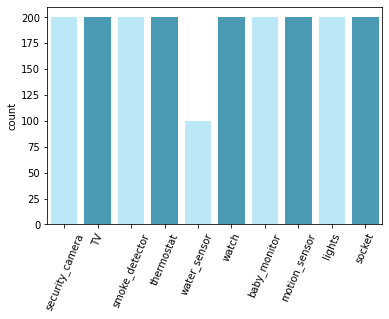

In [15]:
print("Target data shape:")
print("------------------------------")
print(df_cp["device_category"].shape)
print("------------------------------\n")

print("Target data distribution:")
print("------------------------------")
print(df_cp["device_category"].value_counts())
print("------------------------------\n")

print("Target data countplot:")
print("------------------------------")
plt.xticks(rotation = 67)
sns.countplot(data = df_cp["device_category"],
              x = df_cp["device_category"].values,
              palette = ["#b3ecff", "#39a3c6"]);
print("------------------------------\n")

Now that we have binomials that are not skewed and do not overlap we can proceed onto processing our numerical/temporal features. We don't have much to do in terms of trimming anymore skew because we've already removed columns that had only 1 unique value and separated out our binomials. Therefore the only features left have 3 or more unique values, which is acceptable, and their target contributions would also preclude them from removal.

So instead let's begin with plotting our data's relationships with itself and our target variable.

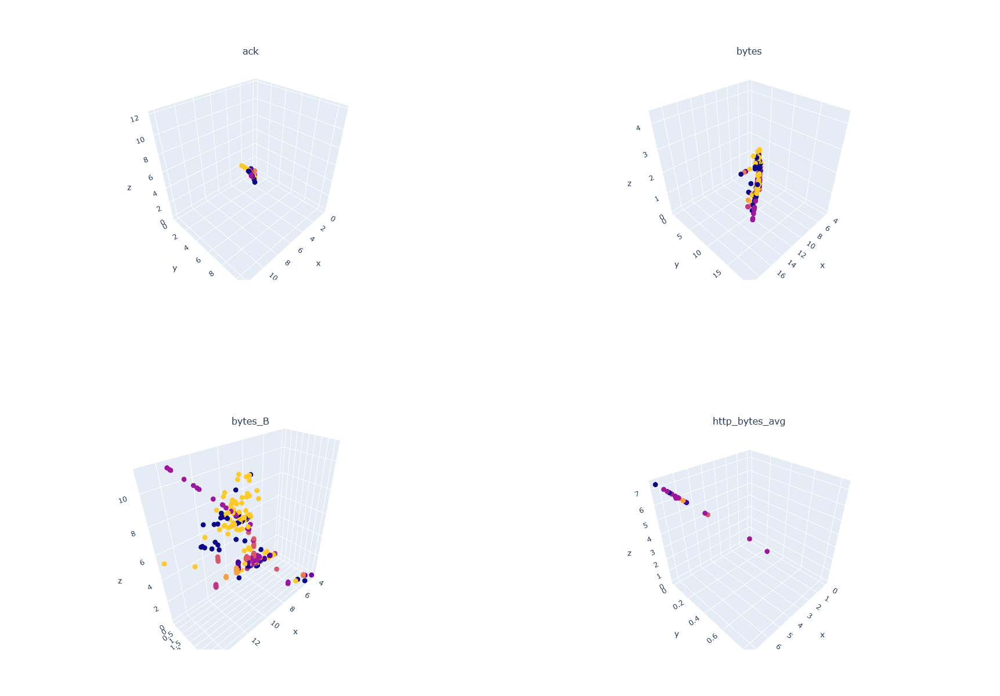

In [16]:
# we should first prepare our dataframe for plotting:
# > log(1 + x) all numerical data so that we don't have wild numbers
# > labelencode our target column for easy colouring
# > concatenate both into one dataframe

targ_3d = df_cp["device_category"]
lenc = LabelEncoder()
lenc.fit(targ_3d)
targ_3d = lenc.transform(targ_3d)
targ_3d = pd.Series(targ_3d, name = "device_category")

df_3d = df_cp.drop(["device_category"], axis = 1).copy()
df_3d = np.log1p(df_3d)
df_3d = pd.concat([df_3d, targ_3d], axis = 1)

del(targ_3d)

# now we prepare our plotting surface using plotly:
# > initialise a 2x2 subplot surface
# > populate every (row, col) with a 3d scatterplot coloured by our target

fig = make_subplots(rows = 2, cols = 2,
                    specs = [[{"type": "Scatter3d"}, {"type": "Scatter3d"}],
                             [{"type": "Scatter3d"}, {"type": "Scatter3d"}]],
                    subplot_titles = (df_3d.columns[0], df_3d.columns[3],
                                      df_3d.columns[6], df_3d.columns[9]))

fig.add_trace(
    go.Scatter3d(x = df_3d.iloc[:, 0],
                 y = df_3d.iloc[:, 1],
                 z = df_3d.iloc[:, 2],
                 mode = "markers",
                 marker_size = 5,
                 marker_color = df_3d["device_category"]),
    row = 1, col = 1
)

fig.add_trace(
    go.Scatter3d(x = df_3d.iloc[:, 3],
                 y = df_3d.iloc[:, 4],
                 z = df_3d.iloc[:, 5],
                 mode = "markers",
                 marker_size = 5,
                 marker_color = df_3d["device_category"]),
    row = 1, col = 2
)

fig.add_trace(
    go.Scatter3d(x = df_3d.iloc[:, 6],
                 y = df_3d.iloc[:, 7],
                 z = df_3d.iloc[:, 8],
                 mode = "markers",
                 marker_size = 5,
                 marker_color = df_3d["device_category"]),
    row = 2, col = 1
)

fig.add_trace(
    go.Scatter3d(x = df_3d.iloc[:, 9],
                 y = df_3d.iloc[:, 10],
                 z = df_3d.iloc[:, 11],
                 mode = "markers",
                 marker_size = 5,
                 marker_color = df_3d["device_category"]),
    row = 2, col = 2
)

fig.update_layout(height = 1200, showlegend = False)
fig.show()

Using our 3d scatters we can see that some columns are so entangled they're basically quantum states in terms of separability in 3D, but they do have some rather interesting linear relationships with the sister columns they've been plotted with. What's coming up might get a little messy, but let's Just Do It<sup>tm</sup>: we'll pairplot some portions of our dataset with regression lines to see what kind of relationships our data has. We'll also get a good glimpse at how the relationship our features have with our targets as well as our features' distributions after logging and standardising them.

**[Future me]:** originally the plot diagonal was supposed to be a KDE, but apparently the 8th feature doesn't play well with KDEs compared to histograms because it raises a `singular matrix` error (see 
<a href="https://github.com/mwaskom/seaborn/issues/1502">issue 1502</a>, corresponding with <a href="https://github.com/mwaskom/seaborn/pull/1823">pull 1823</a>): apparently the `kdeplot` fails when any of the variables is integer (or discrete with large bin sizes). The average k-nearest distance is then 0 (for not too large `k`), which then screws over the kernel width estimation of the KDE (for a more detailed explanation, see <a href="https://stats.stackexchange.com/questions/89754/statsmodels-error-in-kde-on-a-list-of-repeated-values">this SX discussion.</a>)

Linearity check: 1/5
------------------------------


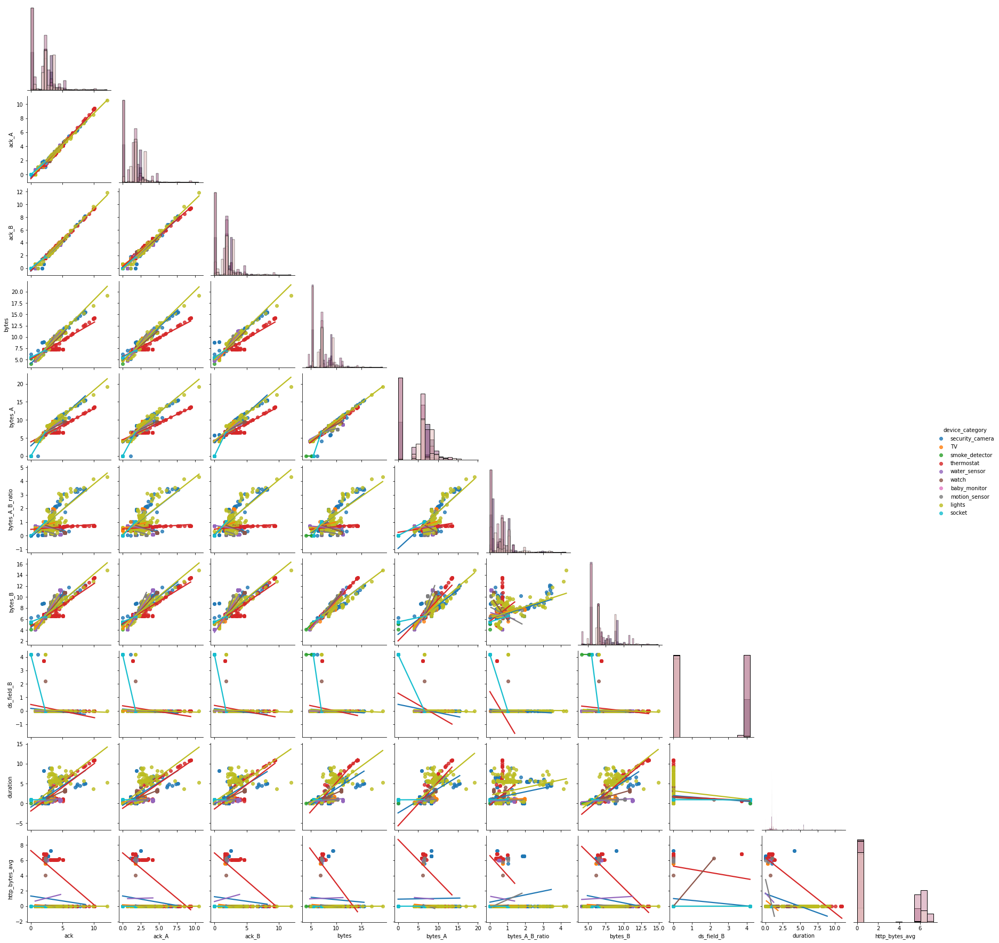

In [17]:
spp = sns.pairplot(data = pd.concat([df_3d.iloc[:, :10], df_3d["device_category"]], axis = 1),
                   kind = "reg",
                   diag_kind = "hist",
                   corner = True,
                   hue = "device_category",
                   plot_kws = {"ci": None});

spp._legend.set_title("device_category")
new_labels = df_cp["device_category"].unique()
for text, labels in zip(spp._legend.texts, new_labels):
    text.set_text(labels)

print("Linearity check: 1/5")
print("------------------------------")

Linearity check: 2/5
------------------------------


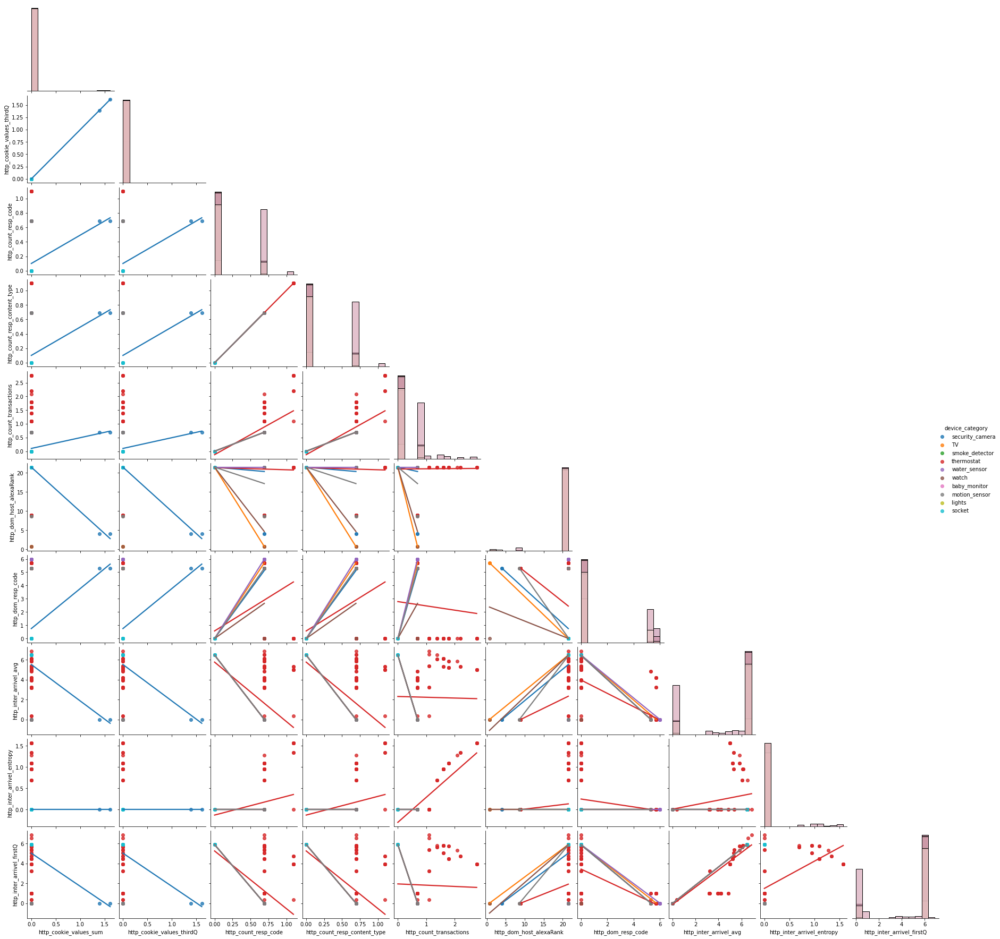

In [18]:
spp = sns.pairplot(data = pd.concat([df_3d.iloc[:, 25:35], df_3d["device_category"]], axis = 1),
                   kind = "reg",
                   diag_kind = "hist",
                   corner = True,
                   hue = "device_category",
                   plot_kws = {"ci": None});

spp._legend.set_title("device_category")
new_labels = df_cp["device_category"].unique()
for text, labels in zip(spp._legend.texts, new_labels):
    text.set_text(labels)

print("Linearity check: 2/5")
print("------------------------------")

Linearity check: 3/5
------------------------------


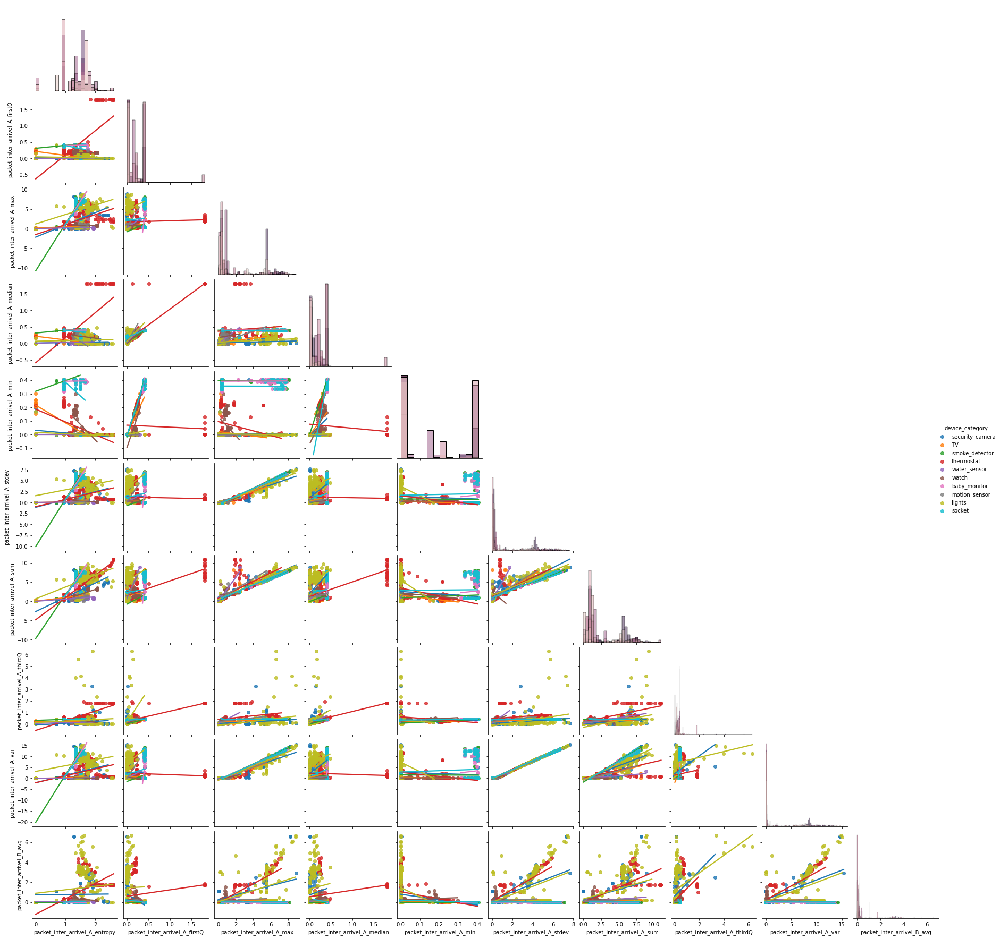

In [19]:
spp = sns.pairplot(data = pd.concat([df_3d.iloc[:, 70:80], df_3d["device_category"]], axis = 1),
                   kind = "reg",
                   diag_kind = "hist",
                   corner = True,
                   hue = "device_category",
                   plot_kws = {"ci": None});

spp._legend.set_title("device_category")
new_labels = df_cp["device_category"].unique()
for text, labels in zip(spp._legend.texts, new_labels):
    text.set_text(labels)

print("Linearity check: 3/5")
print("------------------------------")

Linearity check: 4/5
------------------------------


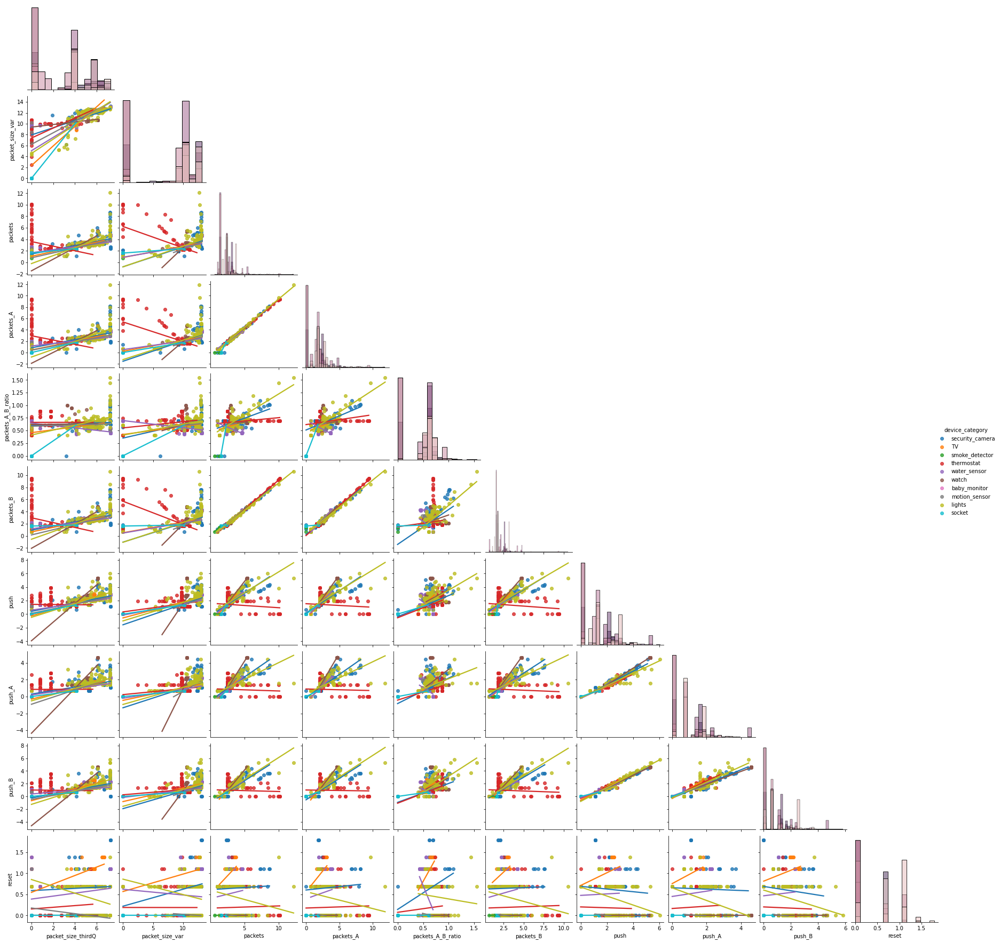

In [20]:
spp = sns.pairplot(data = pd.concat([df_3d.iloc[:, 125:135], df_3d["device_category"]], axis = 1),
                   kind = "reg",
                   diag_kind = "hist",
                   corner = True,
                   hue = "device_category",
                   plot_kws = {"ci": None});

spp._legend.set_title("device_category")
new_labels = df_cp["device_category"].unique()
for text, labels in zip(spp._legend.texts, new_labels):
    text.set_text(labels)

print("Linearity check: 4/5")
print("------------------------------")

Linearity check: 5/5
------------------------------


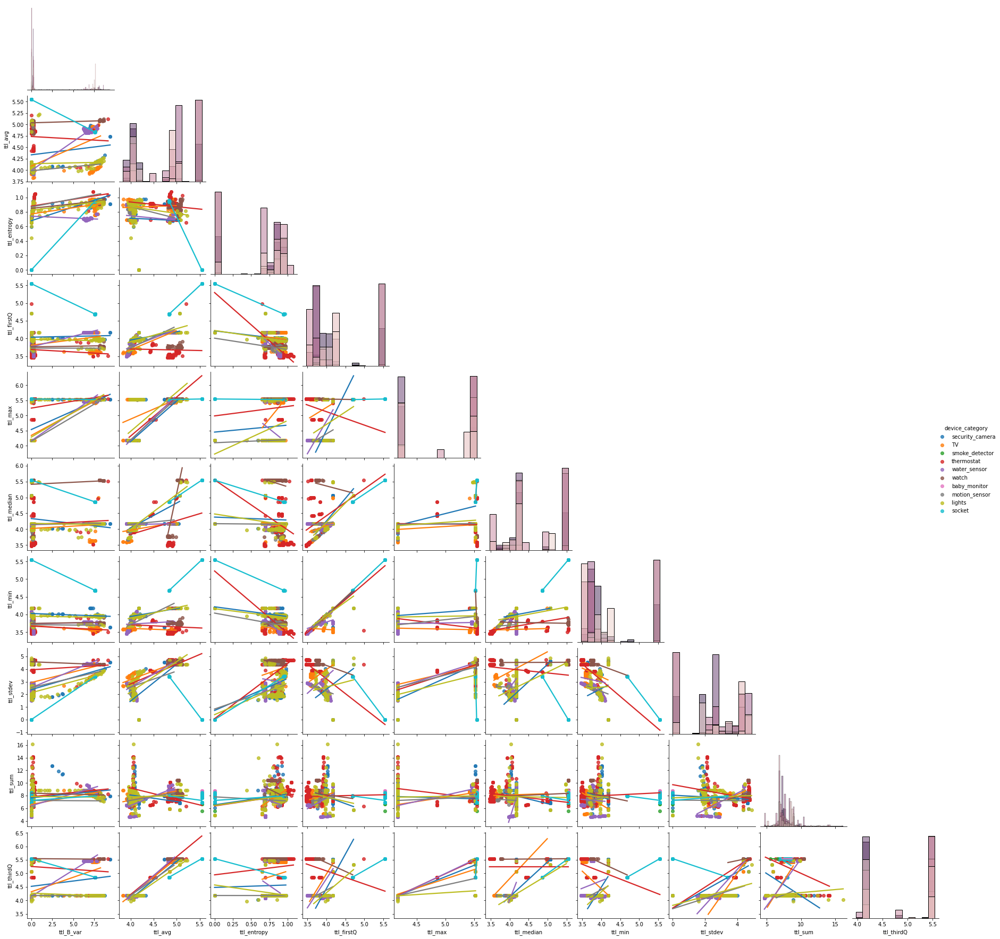

In [21]:
spp = sns.pairplot(data = pd.concat([df_3d.iloc[:, 195:205], df_3d["device_category"]], axis = 1),
                   kind = "reg",
                   diag_kind = "hist",
                   corner = True,
                   hue = "device_category",
                   plot_kws = {"ci": None});

spp._legend.set_title("device_category")
new_labels = df_cp["device_category"].unique()
for text, labels in zip(spp._legend.texts, new_labels):
    text.set_text(labels)

print("Linearity check: 5/5")
print("------------------------------")

del(spp, new_labels)

These were rather revealing: some taget variables have linear relationships to some features (and some features are linearly related with themselves and/or others) but overall they're very non-linear and very messy. It also appears that (at least in terms of the shape of the scatter, not the regression lines) some of our features are exponentially related to our target. Let's have a quick look at our distributions before checking out a QQ plot, the latter should be very informative!

A gentle reminder: always remember to standardise your data before boxplotting it (or using any variant of a boxplot.) Also quite interestingly, the 8th feature plays well with a violinplot even though a KDE is created for it.

Scaled & logged data violins:
------------------------------


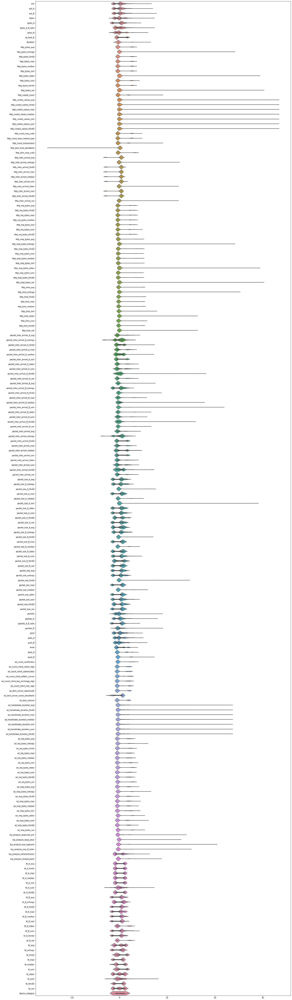

In [22]:
# it is probably more prudent to use StandardScaler() here due to its function
# persistence, but we're still a ways away from finalising our dataset after
# preprocessing and a quick standardisation will suffice for what our current
# purpose is: violin plotting.

fig, axes = plt.subplots(figsize=(25, 100))
sns.violinplot(data = stats.zscore(df_3d),
               orient = "h",
               scale = "width");

print("Scaled & logged data violins:")
print("------------------------------")

The log transformation helped most of our data come into a somewhat normal distribution but there are still a few funky columns that we should probably take a look at.

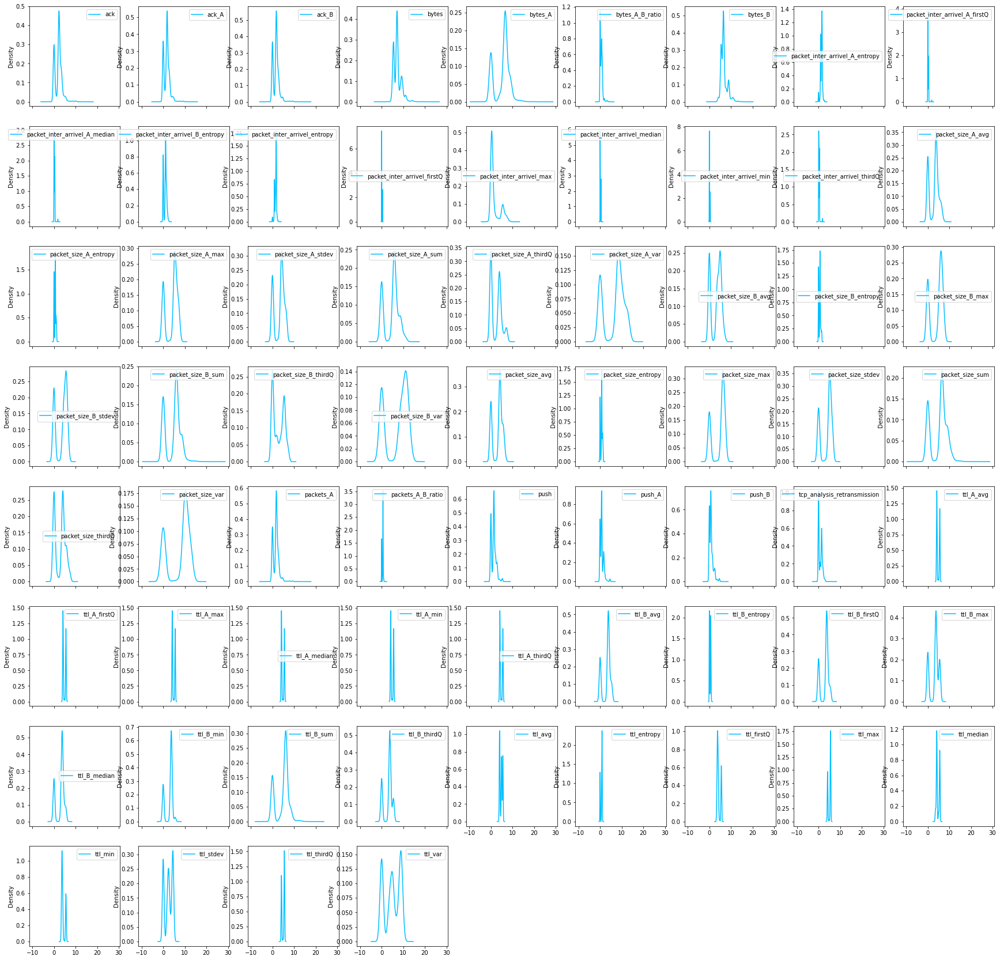

In [23]:
f_cols = ["ack", "ack_A", "ack_B", "bytes", "bytes_A", "bytes_A_B_ratio",
          "bytes_B", "packet_inter_arrivel_A_entropy",
          "packet_inter_arrivel_A_firstQ", "packet_inter_arrivel_A_median",
          "packet_inter_arrivel_B_entropy",
          "packet_inter_arrivel_entropy", "packet_inter_arrivel_firstQ",
          "packet_inter_arrivel_max", "packet_inter_arrivel_median",
          "packet_inter_arrivel_min", "packet_inter_arrivel_thirdQ",
          "packet_size_A_avg", "packet_size_A_entropy", "packet_size_A_max",
          "packet_size_A_stdev", "packet_size_A_sum", "packet_size_A_thirdQ",
          "packet_size_A_var", "packet_size_B_avg", "packet_size_B_entropy",
          "packet_size_B_max", "packet_size_B_stdev", "packet_size_B_sum",
          "packet_size_B_thirdQ", "packet_size_B_var", "packet_size_avg",
          "packet_size_entropy", "packet_size_max", "packet_size_stdev",
          "packet_size_sum", "packet_size_thirdQ", "packet_size_var",
          "packets_A", "packets_A_B_ratio", "push", "push_A", "push_B",
          "tcp_analysis_retransmission", "ttl_A_avg", "ttl_A_firstQ",
          "ttl_A_max", "ttl_A_median", "ttl_A_min", "ttl_A_thirdQ",
          "ttl_B_avg", "ttl_B_entropy", "ttl_B_firstQ", "ttl_B_max",
          "ttl_B_median", "ttl_B_min", "ttl_B_sum", "ttl_B_thirdQ",
          "ttl_avg", "ttl_entropy", "ttl_firstQ", "ttl_max", "ttl_median",
          "ttl_min", "ttl_stdev", "ttl_thirdQ", "ttl_var"]

df_3d[f_cols].plot.kde(subplots = True, figsize = (30, 30),
                       layout = (8, 9), color = "deepskyblue");

Everything seems to be fine, some kind of scaling should help bring what seems to be kurtic features closer towards normality. let's now check out our data's QQ plots before we get into the model building.

Scaled & logged data QQplot:
------------------------------


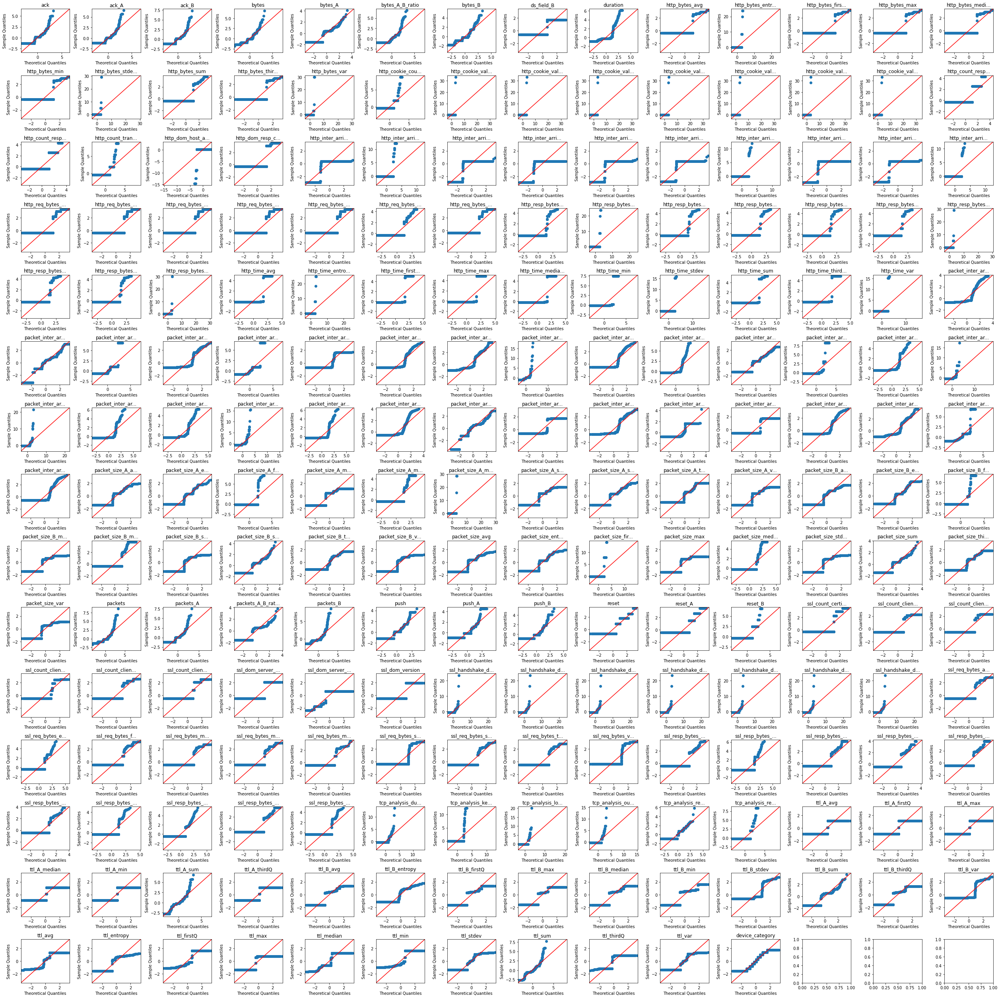

In [24]:
# Some of our column names are very long, we can truncate them like so (MCVE):
# ls = "longstring"
# print(ls[:5] + "..." if len(ls) > 5 else ls)
# > longs...

fig, axes = plt.subplots(ncols=14, nrows=15, figsize=(35, 35))

for col, ax in zip(df_3d.columns, np.ravel(axes)):
    sm.qqplot(stats.zscore(df_3d[col]), line = "45", ax = ax)
    ax.set_title((col[0:15] + "..." if len(col) > 15 else col))

print("Scaled & logged data QQplot:")
print("------------------------------")
plt.tight_layout()
plt.show()

This doesn't look *too* bad, regularisation should help a lot with the spread. Finally let's look at our correlations (which regularisation should help with as well.)

Correlation matrix:
------------------------------


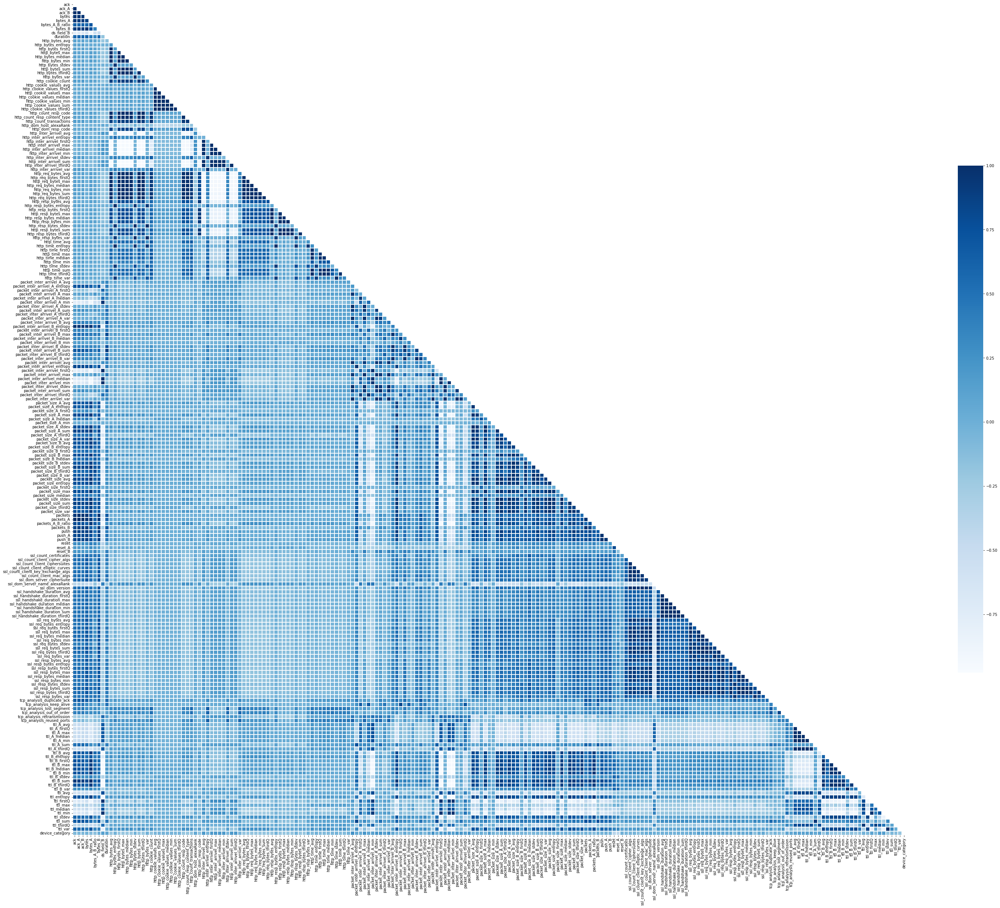

In [25]:
fig, ax = plt.subplots(figsize=(50, 50))
sns.heatmap(data = df_3d.corr(),
            cmap = "Blues",
            square = True,
            linewidths = 0.02,
            linecolor = "white",
            cbar_kws = {"shrink": 0.5},
            mask = np.triu(df_3d.corr()),
            ax = ax);

print("Correlation matrix:")
print("------------------------------")

Our iceberg confirms what we suspected: statistical measures (\*\_avg, \*\_median, \*\_mode), which is what our dataframe's DNA is, sports some extreme correlations with other statistical measures. Regularisation should help tremendously here, but we can also try RFE after every model we build. Additionally, we can also try clustering: we can group the datapoints that are very close to each other (using dissimilarity based on correlation) and see if that helps.

Alright well it looks like we're about ready to go, let's concatenate all our dataframes together and go over a final check.  
`df_final = df_binom + df_3d[-"device_category"] + df_cp["device_category"]`

In [26]:
df_final = pd.concat([df_3d.drop("device_category", axis = 1),
                      df_binom,
                      df_cp["device_category"]],
                      axis = 1)
dm.data_viewer(df_final)


--------------------
Shape:
--------------------
(1900, 223)

--------------------
Head:
--------------------


,ack,ack_A,ack_B,bytes,bytes_A,bytes_A_B_ratio,bytes_B,ds_field_B,duration,http_bytes_avg,http_bytes_entropy,http_bytes_firstQ,http_bytes_max,http_bytes_median,http_bytes_min,http_bytes_stdev,http_bytes_sum,http_bytes_thirdQ,http_bytes_var,http_cookie_count,http_cookie_values_avg,http_cookie_values_firstQ,http_cookie_values_max,http_cookie_values_median,http_cookie_values_min,http_cookie_values_sum,http_cookie_values_thirdQ,http_count_resp_code,http_count_resp_content_type,http_count_transactions,http_dom_host_alexaRank,http_dom_resp_code,http_inter_arrivel_avg,http_inter_arrivel_entropy,http_inter_arrivel_firstQ,http_inter_arrivel_max,http_inter_arrivel_median,http_inter_arrivel_min,http_inter_arrivel_stdev,http_inter_arrivel_sum,http_inter_arrivel_thirdQ,http_inter_arrivel_var,http_req_bytes_avg,http_req_bytes_firstQ,http_req_bytes_max,http_req_bytes_median,http_req_bytes_min,http_req_bytes_sum,http_req_bytes_thirdQ,http_resp_bytes_avg,http_resp_bytes_entropy,http_resp_bytes_firstQ,http_resp_bytes_max,http_resp_bytes_median,http_resp_bytes_min,http_resp_bytes_stdev,http_resp_bytes_sum,http_resp_bytes_thirdQ,http_resp_bytes_var,http_time_avg,http_time_entropy,http_time_firstQ,http_time_max,http_time_median,http_time_min,http_time_stdev,http_time_sum,http_time_thirdQ,http_time_var,packet_inter_arrivel_A_avg,packet_inter_arrivel_A_entropy,packet_inter_arrivel_A_firstQ,packet_inter_arrivel_A_max,packet_inter_arrivel_A_median,packet_inter_arrivel_A_min,packet_inter_arrivel_A_stdev,packet_inter_arrivel_A_sum,packet_inter_arrivel_A_thirdQ,packet_inter_arrivel_A_var,packet_inter_arrivel_B_avg,packet_inter_arrivel_B_entropy,packet_inter_arrivel_B_firstQ,packet_inter_arrivel_B_max,packet_inter_arrivel_B_median,packet_inter_arrivel_B_min,packet_inter_arrivel_B_stdev,packet_inter_arrivel_B_sum,packet_inter_arrivel_B_thirdQ,packet_inter_arrivel_B_var,packet_inter_arrivel_avg,packet_inter_arrivel_entropy,packet_inter_arrivel_firstQ,packet_inter_arrivel_max,packet_inter_arrivel_median,packet_inter_arrivel_min,packet_inter_arrivel_stdev,packet_inter_arrivel_sum,packet_inter_arrivel_thirdQ,packet_inter_arrivel_var,packet_size_A_avg,packet_size_A_entropy,packet_size_A_firstQ,packet_size_A_max,packet_size_A_median,packet_size_A_min,packet_size_A_stdev,packet_size_A_sum,packet_size_A_thirdQ,packet_size_A_var,packet_size_B_avg,packet_size_B_entropy,packet_size_B_firstQ,packet_size_B_max,packet_size_B_median,packet_size_B_stdev,packet_size_B_sum,packet_size_B_thirdQ,packet_size_B_var,packet_size_avg,packet_size_entropy,packet_size_firstQ,packet_size_max,packet_size_median,packet_size_stdev,packet_size_sum,packet_size_thirdQ,packet_size_var,packets,packets_A,packets_A_B_ratio,packets_B,push,push_A,push_B,reset,reset_A,reset_B,ssl_count_certificates,ssl_count_client_cipher_algs,ssl_count_client_ciphersuites,ssl_count_client_elliptic_curves,ssl_count_client_key_exchange_algs,ssl_count_client_mac_algs,ssl_dom_server_ciphersuite,ssl_dom_server_name_alexaRank,ssl_dom_version,ssl_handshake_duration_avg,ssl_handshake_duration_firstQ,ssl_handshake_duration_max,ssl_handshake_duration_median,ssl_handshake_duration_min,ssl_handshake_duration_sum,ssl_handshake_duration_thirdQ,ssl_req_bytes_avg,ssl_req_bytes_entropy,ssl_req_bytes_firstQ,ssl_req_bytes_max,ssl_req_bytes_median,ssl_req_bytes_min,ssl_req_bytes_stdev,ssl_req_bytes_sum,ssl_req_bytes_thirdQ,ssl_req_bytes_var,ssl_resp_bytes_avg,ssl_resp_bytes_entropy,ssl_resp_bytes_firstQ,ssl_resp_bytes_max,ssl_resp_bytes_median,ssl_resp_bytes_min,ssl_resp_bytes_stdev,ssl_resp_bytes_sum,ssl_resp_bytes_thirdQ,ssl_resp_bytes_var,tcp_analysis_duplicate_ack,tcp_analysis_keep_alive,tcp_analysis_lost_segment,tcp_analysis_out_of_order,tcp_analysis_retransmission,tcp_analysis_reused_ports,ttl_A_avg,ttl_A_firstQ,ttl_A_max,ttl_A_median,ttl_A_min,ttl_A_sum,ttl_A_thirdQ,ttl_B_avg,ttl_B_entropy,ttl_B_firstQ,ttl_B_max,ttl_B_median,ttl_B_min,ttl_B_stdev,ttl_B_sum,ttl_B_thirdQ,ttl_B_var,ttl_avg,ttl_entropy,ttl_firstQ,ttl_max,ttl_medi


--------------------
Tail:
--------------------


,ack,ack_A,ack_B,bytes,bytes_A,bytes_A_B_ratio,bytes_B,ds_field_B,duration,http_bytes_avg,http_bytes_entropy,http_bytes_firstQ,http_bytes_max,http_bytes_median,http_bytes_min,http_bytes_stdev,http_bytes_sum,http_bytes_thirdQ,http_bytes_var,http_cookie_count,http_cookie_values_avg,http_cookie_values_firstQ,http_cookie_values_max,http_cookie_values_median,http_cookie_values_min,http_cookie_values_sum,http_cookie_values_thirdQ,http_count_resp_code,http_count_resp_content_type,http_count_transactions,http_dom_host_alexaRank,http_dom_resp_code,http_inter_arrivel_avg,http_inter_arrivel_entropy,http_inter_arrivel_firstQ,http_inter_arrivel_max,http_inter_arrivel_median,http_inter_arrivel_min,http_inter_arrivel_stdev,http_inter_arrivel_sum,http_inter_arrivel_thirdQ,http_inter_arrivel_var,http_req_bytes_avg,http_req_bytes_firstQ,http_req_bytes_max,http_req_bytes_median,http_req_bytes_min,http_req_bytes_sum,http_req_bytes_thirdQ,http_resp_bytes_avg,http_resp_bytes_entropy,http_resp_bytes_firstQ,http_resp_bytes_max,http_resp_bytes_median,http_resp_bytes_min,http_resp_bytes_stdev,http_resp_bytes_sum,http_resp_bytes_thirdQ,http_resp_bytes_var,http_time_avg,http_time_entropy,http_time_firstQ,http_time_max,http_time_median,http_time_min,http_time_stdev,http_time_sum,http_time_thirdQ,http_time_var,packet_inter_arrivel_A_avg,packet_inter_arrivel_A_entropy,packet_inter_arrivel_A_firstQ,packet_inter_arrivel_A_max,packet_inter_arrivel_A_median,packet_inter_arrivel_A_min,packet_inter_arrivel_A_stdev,packet_inter_arrivel_A_sum,packet_inter_arrivel_A_thirdQ,packet_inter_arrivel_A_var,packet_inter_arrivel_B_avg,packet_inter_arrivel_B_entropy,packet_inter_arrivel_B_firstQ,packet_inter_arrivel_B_max,packet_inter_arrivel_B_median,packet_inter_arrivel_B_min,packet_inter_arrivel_B_stdev,packet_inter_arrivel_B_sum,packet_inter_arrivel_B_thirdQ,packet_inter_arrivel_B_var,packet_inter_arrivel_avg,packet_inter_arrivel_entropy,packet_inter_arrivel_firstQ,packet_inter_arrivel_max,packet_inter_arrivel_median,packet_inter_arrivel_min,packet_inter_arrivel_stdev,packet_inter_arrivel_sum,packet_inter_arrivel_thirdQ,packet_inter_arrivel_var,packet_size_A_avg,packet_size_A_entropy,packet_size_A_firstQ,packet_size_A_max,packet_size_A_median,packet_size_A_min,packet_size_A_stdev,packet_size_A_sum,packet_size_A_thirdQ,packet_size_A_var,packet_size_B_avg,packet_size_B_entropy,packet_size_B_firstQ,packet_size_B_max,packet_size_B_median,packet_size_B_stdev,packet_size_B_sum,packet_size_B_thirdQ,packet_size_B_var,packet_size_avg,packet_size_entropy,packet_size_firstQ,packet_size_max,packet_size_median,packet_size_stdev,packet_size_sum,packet_size_thirdQ,packet_size_var,packets,packets_A,packets_A_B_ratio,packets_B,push,push_A,push_B,reset,reset_A,reset_B,ssl_count_certificates,ssl_count_client_cipher_algs,ssl_count_client_ciphersuites,ssl_count_client_elliptic_curves,ssl_count_client_key_exchange_algs,ssl_count_client_mac_algs,ssl_dom_server_ciphersuite,ssl_dom_server_name_alexaRank,ssl_dom_version,ssl_handshake_duration_avg,ssl_handshake_duration_firstQ,ssl_handshake_duration_max,ssl_handshake_duration_median,ssl_handshake_duration_min,ssl_handshake_duration_sum,ssl_handshake_duration_thirdQ,ssl_req_bytes_avg,ssl_req_bytes_entropy,ssl_req_bytes_firstQ,ssl_req_bytes_max,ssl_req_bytes_median,ssl_req_bytes_min,ssl_req_bytes_stdev,ssl_req_bytes_sum,ssl_req_bytes_thirdQ,ssl_req_bytes_var,ssl_resp_bytes_avg,ssl_resp_bytes_entropy,ssl_resp_bytes_firstQ,ssl_resp_bytes_max,ssl_resp_bytes_median,ssl_resp_bytes_min,ssl_resp_bytes_stdev,ssl_resp_bytes_sum,ssl_resp_bytes_thirdQ,ssl_resp_bytes_var,tcp_analysis_duplicate_ack,tcp_analysis_keep_alive,tcp_analysis_lost_segment,tcp_analysis_out_of_order,tcp_analysis_retransmission,tcp_analysis_reused_ports,ttl_A_avg,ttl_A_firstQ,ttl_A_max,ttl_A_median,ttl_A_min,ttl_A_sum,ttl_A_thirdQ,ttl_B_avg,ttl_B_entropy,ttl_B_firstQ,ttl_B_max,ttl_B_median,ttl_B_min,ttl_B_stdev,ttl_B_sum,ttl_B_thirdQ,ttl_B_var,ttl_avg,ttl_entropy,ttl_firstQ,ttl_max,ttl_medi


--------------------
Summary:
--------------------


,ack,ack_A,ack_B,bytes,bytes_A,bytes_A_B_ratio,bytes_B,ds_field_B,duration,http_bytes_avg,http_bytes_entropy,http_bytes_firstQ,http_bytes_max,http_bytes_median,http_bytes_min,http_bytes_stdev,http_bytes_sum,http_bytes_thirdQ,http_bytes_var,http_cookie_count,http_cookie_values_avg,http_cookie_values_firstQ,http_cookie_values_max,http_cookie_values_median,http_cookie_values_min,http_cookie_values_sum,http_cookie_values_thirdQ,http_count_resp_code,http_count_resp_content_type,http_count_transactions,http_dom_host_alexaRank,http_dom_resp_code,http_inter_arrivel_avg,http_inter_arrivel_entropy,http_inter_arrivel_firstQ,http_inter_arrivel_max,http_inter_arrivel_median,http_inter_arrivel_min,http_inter_arrivel_stdev,http_inter_arrivel_sum,http_inter_arrivel_thirdQ,http_inter_arrivel_var,http_req_bytes_avg,http_req_bytes_firstQ,http_req_bytes_max,http_req_bytes_median,http_req_bytes_min,http_req_bytes_sum,http_req_bytes_thirdQ,http_resp_bytes_avg,http_resp_bytes_entropy,http_resp_bytes_firstQ,http_resp_bytes_max,http_resp_bytes_median,http_resp_bytes_min,http_resp_bytes_stdev,http_resp_bytes_sum,http_resp_bytes_thirdQ,http_resp_bytes_var,http_time_avg,http_time_entropy,http_time_firstQ,http_time_max,http_time_median,http_time_min,http_time_stdev,http_time_sum,http_time_thirdQ,http_time_var,packet_inter_arrivel_A_avg,packet_inter_arrivel_A_entropy,packet_inter_arrivel_A_firstQ,packet_inter_arrivel_A_max,packet_inter_arrivel_A_median,packet_inter_arrivel_A_min,packet_inter_arrivel_A_stdev,packet_inter_arrivel_A_sum,packet_inter_arrivel_A_thirdQ,packet_inter_arrivel_A_var,packet_inter_arrivel_B_avg,packet_inter_arrivel_B_entropy,packet_inter_arrivel_B_firstQ,packet_inter_arrivel_B_max,packet_inter_arrivel_B_median,packet_inter_arrivel_B_min,packet_inter_arrivel_B_stdev,packet_inter_arrivel_B_sum,packet_inter_arrivel_B_thirdQ,packet_inter_arrivel_B_var,packet_inter_arrivel_avg,packet_inter_arrivel_entropy,packet_inter_arrivel_firstQ,packet_inter_arrivel_max,packet_inter_arrivel_median,packet_inter_arrivel_min,packet_inter_arrivel_stdev,packet_inter_arrivel_sum,packet_inter_arrivel_thirdQ,packet_inter_arrivel_var,packet_size_A_avg,packet_size_A_entropy,packet_size_A_firstQ,packet_size_A_max,packet_size_A_median,packet_size_A_min,packet_size_A_stdev,packet_size_A_sum,packet_size_A_thirdQ,packet_size_A_var,packet_size_B_avg,packet_size_B_entropy,packet_size_B_firstQ,packet_size_B_max,packet_size_B_median,packet_size_B_stdev,packet_size_B_sum,packet_size_B_thirdQ,packet_size_B_var,packet_size_avg,packet_size_entropy,packet_size_firstQ,packet_size_max,packet_size_median,packet_size_stdev,packet_size_sum,packet_size_thirdQ,packet_size_var,packets,packets_A,packets_A_B_ratio,packets_B,push,push_A,push_B,reset,reset_A,reset_B,ssl_count_certificates,ssl_count_client_cipher_algs,ssl_count_client_ciphersuites,ssl_count_client_elliptic_curves,ssl_count_client_key_exchange_algs,ssl_count_client_mac_algs,ssl_dom_server_ciphersuite,ssl_dom_server_name_alexaRank,ssl_dom_version,ssl_handshake_duration_avg,ssl_handshake_duration_firstQ,ssl_handshake_duration_max,ssl_handshake_duration_median,ssl_handshake_duration_min,ssl_handshake_duration_sum,ssl_handshake_duration_thirdQ,ssl_req_bytes_avg,ssl_req_bytes_entropy,ssl_req_bytes_firstQ,ssl_req_bytes_max,ssl_req_bytes_median,ssl_req_bytes_min,ssl_req_bytes_stdev,ssl_req_bytes_sum,ssl_req_bytes_thirdQ,ssl_req_bytes_var,ssl_resp_bytes_avg,ssl_resp_bytes_entropy,ssl_resp_bytes_firstQ,ssl_resp_bytes_max,ssl_resp_bytes_median,ssl_resp_bytes_min,ssl_resp_bytes_stdev,ssl_resp_bytes_sum,ssl_resp_bytes_thirdQ,ssl_resp_bytes_var,tcp_analysis_duplicate_ack,tcp_analysis_keep_alive,tcp_analysis_lost_segment,tcp_analysis_out_of_order,tcp_analysis_retransmission,tcp_analysis_reused_ports,ttl_A_avg,ttl_A_firstQ,ttl_A_max,ttl_A_median,ttl_A_min,ttl_A_sum,ttl_A_thirdQ,ttl_B_avg,ttl_B_entropy,ttl_B_firstQ,ttl_B_max,ttl_B_median,ttl_B_min,ttl_B_stdev,ttl_B_sum,ttl_B_thirdQ,ttl_B_var,ttl_avg,ttl_entropy,ttl_firstQ,ttl_max,ttl_medi


--------------------
Data types:
--------------------
float64    206
int64       16
object       1
dtype: int64

--------------------
Null values:
--------------------
0    223
dtype: int64

--------------------
Uniques:
--------------------
0 columns have 1 unique value(s) [0.00%]
16 columns have 2 unique value(s) [7.17%]
17 columns have 3 unique value(s) [7.62%]
14 columns have 4 unique value(s) [6.28%]




In [27]:
X = df_final.drop("device_category", axis = 1)
y = df_final["device_category"]

X_train, X_test, y_train, y_test = dm.prepare_data(X, y, split_size = 0.33)

X_train shape: (1273, 222)
X_test shape: (627, 222)


In [28]:
# why are we reusing the instance of LabelEncoder() we created before the 3D
# scatterplot but keeping StandardScaler() for later? Simple enough: during
# preprocessing, our target variable won't be (and was not) transformed at all
# because it's the only categorical feature we have, so lenc() can continue to
# work. StandardScaler() OTOH would have gotten some pretty muddled jimmies if
# at all we started dropping columns or doing some other kind of feature engg.

lenc.fit(y_train)

y_train_le = lenc.transform(y_train)
y_test_le = lenc.transform(y_test)

print("y_train:", y_train.values)
print("y_train_le:", y_train_le)

y_train: ['watch' 'watch' 'smoke_detector' ... 'water_sensor' 'lights'
 'smoke_detector']
y_train_le: [8 8 5 ... 9 2 5]


In [29]:
check = pd.DataFrame()
check["dev_cat"] = list(df_final["device_category"].unique())
check["lenc"] = lenc.transform(check["dev_cat"])
check.sort_values(by = "lenc")

,dev_cat,lenc
1,TV,0
6,baby_monitor,1
8,lights,2
7,motion_sensor,3
0,security_camera,4
2,smoke_detector,5
9,socket,6
3,thermostat,7
5,watch,8
4,water_sensor,9


# Model building
<u>Let's review our plan:</u>  
The point of our classification analysis is that we're trying to describe what attributes of an IoT device contribute to whether it's a TV, a smoke_detector, a watch, a water_sensor, etc. In other words, given an `ack` latency of `2.07`; a connection `duration` of `1.08` milliseconds; a `packet_size` amount of `4.08` bytes; etc., there is a high risk of it being a water_sensor for example. To achieve this, we'll do the following:
1. We'll build classifiers using DA, an SVC, and a boosted decision tree forest via XGBoost. Every model will be regularised and validated by predicting against our validation set (df_test). Compared to the original plan, we'll save the neural network for a later time.
2. We'll also rebuild our models after performing some dimensionality reduction:
    1. RFE
    2. Correlation clustering
    3. PCA
    4. NLDR:
        1. LLE
        2. Spectral Clustering
        3. Isomap Embedding
3. We'll *consider* binning our temporal data if required once we finish this routine and see how we do.

A few additional points to note here:
1. It's mathematically proven that discriminant analysis is unaffected by scaling, so we won't be doing that for our DA models.
2. It's mathematically proven (and practically, very painfully so) that SVMs are extremely affected by scaling, so rather than standardising or robustly standardising, we'll normalise our X_\* variables before feeding it into our SVM.
3. It's mathematically proven that decision trees (and forests, rainforests, swamps, savannahs, tropics, etc.) are unaffected by scaling, so we won't be doing that for our tree models either.
4. We have a multiclass problem and using `scoring = "accuracy"` will cause problems with a few of our models due to their inherent binary assumptions (it's an sklearn thing). Therefore we'll use `balanced_accuracy` instead.
5. These models are being run on a 6c12t machine, for context on `n_jobs = -3`.  
<sub>(P.S: #AMD uber alle!)</sub>

In [30]:
# df_test (the validation set) has X columns and the target feature y. We need
# to separate the X and y features and then predict X using our model, then
# check the accuracy using df_test[y] after labelencoding df_test[y]. Remember
# that we log1p'd our version of X!

ftest_X = df_test.drop("device_category", axis = 1)
ftest_X = np.log1p(ftest_X)

ftest_y = df_test["device_category"]
ftest_y_le = lenc.transform(ftest_y)

print("ftest_y shape:", ftest_y.shape, "\n")
display(ftest_X.head(10))

ftest_y shape: (900,) 



,ack,ack_A,ack_B,bytes,bytes_A,bytes_A_B_ratio,bytes_B,ds_field_A,ds_field_B,duration,...,suffix_is_cloudfront.net,suffix_is_co.il,suffix_is_com,suffix_is_com.sg,suffix_is_else,suffix_is_empty_char_value,suffix_is_googleapis.com,suffix_is_net,suffix_is_org,suffix_is_unresolved
0,3.663562,3.044522,2.944439,9.595535,8.963800,0.758511,8.837100,0.0,0.0,1.070076,...,0.0,0.0,0.0,0.0,0.693147,0.0,0.0,0.0,0.0,0.0
1,3.663562,3.044522,2.944439,9.595535,8.963800,0.758511,8.837100,0.0,0.0,1.099279,...,0.0,0.0,0.0,0.0,0.693147,0.0,0.0,0.0,0.0,0.0
2,3.663562,3.044522,2.944439,9.599879,8.963800,0.753602,8.846353,0.0,0.0,1.157918,...,0.0,0.0,0.0,0.0,0.693147,0.0,0.0,0.0,0.0,0.0
3,3.663562,3.044522,2.944439,9.599879,8.963800,0.753602,8.846353,0.0,0.0,1.148069,...,0.0,0.0,0.0,0.0,0.693147,0.0,0.0,0.0,0.0,0.0
4,3.737670,3.044522,3.091042,9.606630,8.986572,0.771935,8.834774,0.0,0.0,1.176252,...,0.0,0.0,0.0,0.0,0.693147,0.0,0.0,0.0,0.0,0.0
5,3.713572,3.044522,3.044522,9.603665,8.979039,0.766643,8.837100,0.0,0.0,1.293877,...,0.0,0.0,0.0,0.0,0.693147,0.0,0.0,0.0,0.0,0.0
6,0.693147,0.000000,0.693147,5.342334,4.317488,0.439696,4.905275,0.0,0.0,0.218091,...,0.0,0.0,0.0,0.0,0.693147,0.0,0.0,0.0,0.0,0.0
7,3.663562,3.044522,2.944439,9.596623,8.963800,0.757278,8.839422,0.0,0.0,1.068291,...,0.0,0.0,0.0,0.0,0.693147,0.0,0.0,0.0,0.0,0.0
8,3.737670,3.044522,3.091042,9.608781,8.986572,0.769437,8.839422,0.0,0.0,1.115273,...,0.0,0.0,0.0,0.0,0.693147,0.0,0.0,0.0,0.0,0.0
9,3.663562,3.044522,2.944439,9.597709,8.963800,0.756049,8.841737,0.0,0.0,1.080075,...,0.0,0.0,0.0,0.0,0.693147,0.0,0.0,0.0,0.0,0.0


## Model 1: Discriminant Analysis (GridSearch)
### 1.1: Linear DA
LDA assumes 2 things:
1. That our data is normally distributed (which our data, for the most part at this point, is).
2. That all of our classes have the same within-class covariance.

The only valid parameter to tune here is what kind of solver we want to use.

In [31]:
lda_params = [{"solver": ["svd", "lsqr", "eigen"]}]
lda = LinearDiscriminantAnalysis(shrinkage = "auto")

gscv_lda = GridSearchCV(estimator = lda,
                        param_grid = lda_params,
                        n_jobs = -3,
                        cv = 5,
                        scoring = "balanced_accuracy")

In [32]:
%time gscv_lda.fit(X = X_train, y = y_train_le)
pred_train_lda = gscv_lda.best_estimator_.predict(X_train)
pred_test_lda = gscv_lda.best_estimator_.predict(X_test)

print("\n### GRID SEARCH: LINEAR DISCRIMINANT ANALYSIS ###")
print("-------------------------")
print("Best estimator:\t\t", gscv_lda.best_estimator_, "\nBest score:\t\t", gscv_lda.best_score_,
      "\t({:.2f}%)".format(gscv_lda.best_score_ * 100))
print("Balanced accuracy train:", balanced_accuracy_score(y_train_le, pred_train_lda),
      "\t({:.2f}%)".format(balanced_accuracy_score(y_train_le, pred_train_lda) * 100))
print("Balanced accuracy test:\t", balanced_accuracy_score(y_test_le, pred_test_lda),
      "\t({:.2f}%)".format(balanced_accuracy_score(y_test_le, pred_test_lda) * 100))

CPU times: total: 188 ms
Wall time: 1.98 s

### GRID SEARCH: LINEAR DISCRIMINANT ANALYSIS ###
-------------------------
Best estimator:		 LinearDiscriminantAnalysis(shrinkage='auto', solver='lsqr') 
Best score:		 0.7964875864875864 	(79.65%)
Balanced accuracy train: 0.8156716417910449 	(81.57%)
Balanced accuracy test:	 0.8030303030303031 	(80.30%)


#### LDA deconstruction
Before we validate our model, let's try to get an intuition into what our LDA is seeing in terms of which classes are important and which aren't, where our decision boundaries are, how many features on average it has placed in each group, etc. This way we can also see which feature contributes the most to the classification followed by the 2nd most important, 3rd, etc. and identify which of our features would be used to determine the type of device we're trying to identify.

LDA used as a classifier has 2 distinct stages:
1. <u>Extraction:</u> where latent variables called discriminants are calculated as linear combinations of the input variables. The coefficients in this linear combination are disciminant coefficients. The first discriminant function created maximises the differences (minimises the correlations) between groups on that function. The second function maximises differences for itself, but also must not be correlated with the previous function. This continues with subsequent functions for all classes (resulting in `n-1` discriminants and coefficients) with the requirement that the new function not be correlated with any of the previous functions. This is the point where the dimensionality reduction provision of LDA comes into play: unlike PCA which is unsupervised and attempts to retain as much covariance as possible, LDA returns the discriminants that are the most different from one another relative to the target classes, ensuring class separability.
2. <u>Classification:</u> where the data points are assigned to classes using the scalar discriminants, based on which side of the discriminant they fall upon (given some scalar threshold, for example d > 0 or d < 0). When combining each coefficient of a discriminant with a feature (for example, `(-4.06 * "ack") + (18.14 * "bytes")`), a score is obtained which, along with the prior probabilities of each target class, is used to calculate the posterior probability of class membership. It is based on this highest probability that classification is carried out.

This first dataframe is our **coefficients & intercept** dataframe, meaning that for class 0 (TV), the discriminant that maximises Class 0's separation from all other classes can be defined as some linear combination of the input variable (or feature) and the coefficient for that feature **(not of the form `y = mx + b`)**. After obtaining the discriminants for every class, Class 0 or Class Not 0 will be predicted depending upon which side of the discriminant a feature falls on using a default scalar threshold of `0.5`.

In [33]:
lda_coefs = pd.DataFrame(gscv_lda.best_estimator_.coef_,
                         columns = gscv_lda.best_estimator_.feature_names_in_)

lda_coefs["INTERCEPT"] = gscv_lda.best_estimator_.intercept_
lda_coefs["ENC_CLASS"] = gscv_lda.best_estimator_.classes_
lda_coefs["STR_CLASS"] = check.sort_values(by = "lenc")["dev_cat"].values

with pd.option_context("display.max_columns", lda_coefs.shape[1]):
    display(lda_coefs)

,ack,ack_A,ack_B,bytes,bytes_A,bytes_A_B_ratio,bytes_B,ds_field_B,duration,http_bytes_avg,http_bytes_entropy,http_bytes_firstQ,http_bytes_max,http_bytes_median,http_bytes_min,http_bytes_stdev,http_bytes_sum,http_bytes_thirdQ,http_bytes_var,http_cookie_count,http_cookie_values_avg,http_cookie_values_firstQ,http_cookie_values_max,http_cookie_values_median,http_cookie_values_min,http_cookie_values_sum,http_cookie_values_thirdQ,http_count_resp_code,http_count_resp_content_type,http_count_transactions,http_dom_host_alexaRank,http_dom_resp_code,http_inter_arrivel_avg,http_inter_arrivel_entropy,http_inter_arrivel_firstQ,http_inter_arrivel_max,http_inter_arrivel_median,http_inter_arrivel_min,http_inter_arrivel_stdev,http_inter_arrivel_sum,http_inter_arrivel_thirdQ,http_inter_arrivel_var,http_req_bytes_avg,http_req_bytes_firstQ,http_req_bytes_max,http_req_bytes_median,http_req_bytes_min,http_req_bytes_sum,http_req_bytes_thirdQ,http_resp_bytes_avg,http_resp_bytes_entropy,http_resp_bytes_firstQ,http_resp_bytes_max,http_resp_bytes_median,http_resp_bytes_min,http_resp_bytes_stdev,http_resp_bytes_sum,http_resp_bytes_thirdQ,http_resp_bytes_var,http_time_avg,http_time_entropy,http_time_firstQ,http_time_max,http_time_median,http_time_min,http_time_stdev,http_time_sum,http_time_thirdQ,http_time_var,packet_inter_arrivel_A_avg,packet_inter_arrivel_A_entropy,packet_inter_arrivel_A_firstQ,packet_inter_arrivel_A_max,packet_inter_arrivel_A_median,packet_inter_arrivel_A_min,packet_inter_arrivel_A_stdev,packet_inter_arrivel_A_sum,packet_inter_arrivel_A_thirdQ,packet_inter_arrivel_A_var,packet_inter_arrivel_B_avg,packet_inter_arrivel_B_entropy,packet_inter_arrivel_B_firstQ,packet_inter_arrivel_B_max,packet_inter_arrivel_B_median,packet_inter_arrivel_B_min,packet_inter_arrivel_B_stdev,packet_inter_arrivel_B_sum,packet_inter_arrivel_B_thirdQ,packet_inter_arrivel_B_var,packet_inter_arrivel_avg,packet_inter_arrivel_entropy,packet_inter_arrivel_firstQ,packet_inter_arrivel_max,packet_inter_arrivel_median,packet_inter_arrivel_min,packet_inter_arrivel_stdev,packet_inter_arrivel_sum,packet_inter_arrivel_thirdQ,packet_inter_arrivel_var,packet_size_A_avg,packet_size_A_entropy,packet_size_A_firstQ,packet_size_A_max,packet_size_A_median,packet_size_A_min,packet_size_A_stdev,packet_size_A_sum,packet_size_A_thirdQ,packet_size_A_var,packet_size_B_avg,packet_size_B_entropy,packet_size_B_firstQ,packet_size_B_max,packet_size_B_median,packet_size_B_stdev,packet_size_B_sum,packet_size_B_thirdQ,packet_size_B_var,packet_size_avg,packet_size_entropy,packet_size_firstQ,packet_size_max,packet_size_median,packet_size_stdev,packet_size_sum,packet_size_thirdQ,packet_size_var,packets,packets_A,packets_A_B_ratio,packets_B,push,push_A,push_B,reset,reset_A,reset_B,ssl_count_certificates,ssl_count_client_cipher_algs,ssl_count_client_ciphersuites,ssl_count_client_elliptic_curves,ssl_count_client_key_exchange_algs,ssl_count_client_mac_algs,ssl_dom_server_ciphersuite,ssl_dom_server_name_alexaRank,ssl_dom_version,ssl_handshake_duration_avg,ssl_handshake_duration_firstQ,ssl_handshake_duration_max,ssl_handshake_duration_median,ssl_handshake_duration_min,ssl_handshake_duration_sum,ssl_handshake_duration_thirdQ,ssl_req_bytes_avg,ssl_req_bytes_entropy,ssl_req_bytes_firstQ,ssl_req_bytes_max,ssl_req_bytes_median,ssl_req_bytes_min,ssl_req_bytes_stdev,ssl_req_bytes_sum,ssl_req_bytes_thirdQ,ssl_req_bytes_var,ssl_resp_bytes_avg,ssl_resp_bytes_entropy,ssl_resp_bytes_firstQ,ssl_resp_bytes_max,ssl_resp_bytes_median,ssl_resp_bytes_min,ssl_resp_bytes_stdev,ssl_resp_bytes_sum,ssl_resp_bytes_thirdQ,ssl_resp_bytes_var,tcp_analysis_duplicate_ack,tcp_analysis_keep_alive,tcp_analysis_lost_segment,tcp_analysis_out_of_order,tcp_analysis_retransmission,tcp_analysis_reused_ports,ttl_A_avg,ttl_A_firstQ,ttl_A_max,ttl_A_median,ttl_A_min,ttl_A_sum,ttl_A_thirdQ,ttl_B_avg,ttl_B_entropy,ttl_B_firstQ,ttl_B_max,ttl_B_median,ttl_B_min,ttl_B_stdev,ttl_B_sum,ttl_B_thirdQ,ttl_B_var,ttl_avg,ttl_entropy,ttl_firstQ,ttl_max,ttl_medi

This second dataframe is our **group means** dataframe, which displays the average of each feature within a class. For example, class 0 (TV) has an average `ack` of 2.71 and an average `bytes` of 7.88. These means are significant because the mathematical function describing the discriminants can be obtained by plugging the mean vectors per class and the sample covariance marix into the discriminant function, which itself is the decision boundary. Data points are classified based on their location in feature space relative to this function.

In other words, for each pair of classes (e.g. Class 1 and Class 2, or in our case Class 1 and Class Not 1) there is a class boundary between them. This boundary has to pass through the middle-point between the two class means (class centroids), and so is of the form  `(μ1 + μ2)/2`. One of the central LDA results is that this boundary is a straight line orthogonal to `W^-1(μ1 − μ2)`, where `W = ∑i(xi − μk) * (xi − μk).T` (the sum is over all datapoints in the sample vector with the centroid of the respective class being subtracted from each point, basically the distance between each datapoint and the class mean.)

In [34]:
lda_means = pd.DataFrame(gscv_lda.best_estimator_.means_,
                         columns = gscv_lda.best_estimator_.feature_names_in_)

# there isn't really a reason to have the intercept be a part of this dataframe
lda_means["ENC_CLASS"] = gscv_lda.best_estimator_.classes_
lda_means["STR_CLASS"] = check.sort_values(by = "lenc")["dev_cat"].values

with pd.option_context("display.max_columns", lda_means.shape[1]):
    display(lda_means)

,ack,ack_A,ack_B,bytes,bytes_A,bytes_A_B_ratio,bytes_B,ds_field_B,duration,http_bytes_avg,http_bytes_entropy,http_bytes_firstQ,http_bytes_max,http_bytes_median,http_bytes_min,http_bytes_stdev,http_bytes_sum,http_bytes_thirdQ,http_bytes_var,http_cookie_count,http_cookie_values_avg,http_cookie_values_firstQ,http_cookie_values_max,http_cookie_values_median,http_cookie_values_min,http_cookie_values_sum,http_cookie_values_thirdQ,http_count_resp_code,http_count_resp_content_type,http_count_transactions,http_dom_host_alexaRank,http_dom_resp_code,http_inter_arrivel_avg,http_inter_arrivel_entropy,http_inter_arrivel_firstQ,http_inter_arrivel_max,http_inter_arrivel_median,http_inter_arrivel_min,http_inter_arrivel_stdev,http_inter_arrivel_sum,http_inter_arrivel_thirdQ,http_inter_arrivel_var,http_req_bytes_avg,http_req_bytes_firstQ,http_req_bytes_max,http_req_bytes_median,http_req_bytes_min,http_req_bytes_sum,http_req_bytes_thirdQ,http_resp_bytes_avg,http_resp_bytes_entropy,http_resp_bytes_firstQ,http_resp_bytes_max,http_resp_bytes_median,http_resp_bytes_min,http_resp_bytes_stdev,http_resp_bytes_sum,http_resp_bytes_thirdQ,http_resp_bytes_var,http_time_avg,http_time_entropy,http_time_firstQ,http_time_max,http_time_median,http_time_min,http_time_stdev,http_time_sum,http_time_thirdQ,http_time_var,packet_inter_arrivel_A_avg,packet_inter_arrivel_A_entropy,packet_inter_arrivel_A_firstQ,packet_inter_arrivel_A_max,packet_inter_arrivel_A_median,packet_inter_arrivel_A_min,packet_inter_arrivel_A_stdev,packet_inter_arrivel_A_sum,packet_inter_arrivel_A_thirdQ,packet_inter_arrivel_A_var,packet_inter_arrivel_B_avg,packet_inter_arrivel_B_entropy,packet_inter_arrivel_B_firstQ,packet_inter_arrivel_B_max,packet_inter_arrivel_B_median,packet_inter_arrivel_B_min,packet_inter_arrivel_B_stdev,packet_inter_arrivel_B_sum,packet_inter_arrivel_B_thirdQ,packet_inter_arrivel_B_var,packet_inter_arrivel_avg,packet_inter_arrivel_entropy,packet_inter_arrivel_firstQ,packet_inter_arrivel_max,packet_inter_arrivel_median,packet_inter_arrivel_min,packet_inter_arrivel_stdev,packet_inter_arrivel_sum,packet_inter_arrivel_thirdQ,packet_inter_arrivel_var,packet_size_A_avg,packet_size_A_entropy,packet_size_A_firstQ,packet_size_A_max,packet_size_A_median,packet_size_A_min,packet_size_A_stdev,packet_size_A_sum,packet_size_A_thirdQ,packet_size_A_var,packet_size_B_avg,packet_size_B_entropy,packet_size_B_firstQ,packet_size_B_max,packet_size_B_median,packet_size_B_stdev,packet_size_B_sum,packet_size_B_thirdQ,packet_size_B_var,packet_size_avg,packet_size_entropy,packet_size_firstQ,packet_size_max,packet_size_median,packet_size_stdev,packet_size_sum,packet_size_thirdQ,packet_size_var,packets,packets_A,packets_A_B_ratio,packets_B,push,push_A,push_B,reset,reset_A,reset_B,ssl_count_certificates,ssl_count_client_cipher_algs,ssl_count_client_ciphersuites,ssl_count_client_elliptic_curves,ssl_count_client_key_exchange_algs,ssl_count_client_mac_algs,ssl_dom_server_ciphersuite,ssl_dom_server_name_alexaRank,ssl_dom_version,ssl_handshake_duration_avg,ssl_handshake_duration_firstQ,ssl_handshake_duration_max,ssl_handshake_duration_median,ssl_handshake_duration_min,ssl_handshake_duration_sum,ssl_handshake_duration_thirdQ,ssl_req_bytes_avg,ssl_req_bytes_entropy,ssl_req_bytes_firstQ,ssl_req_bytes_max,ssl_req_bytes_median,ssl_req_bytes_min,ssl_req_bytes_stdev,ssl_req_bytes_sum,ssl_req_bytes_thirdQ,ssl_req_bytes_var,ssl_resp_bytes_avg,ssl_resp_bytes_entropy,ssl_resp_bytes_firstQ,ssl_resp_bytes_max,ssl_resp_bytes_median,ssl_resp_bytes_min,ssl_resp_bytes_stdev,ssl_resp_bytes_sum,ssl_resp_bytes_thirdQ,ssl_resp_bytes_var,tcp_analysis_duplicate_ack,tcp_analysis_keep_alive,tcp_analysis_lost_segment,tcp_analysis_out_of_order,tcp_analysis_retransmission,tcp_analysis_reused_ports,ttl_A_avg,ttl_A_firstQ,ttl_A_max,ttl_A_median,ttl_A_min,ttl_A_sum,ttl_A_thirdQ,ttl_B_avg,ttl_B_entropy,ttl_B_firstQ,ttl_B_max,ttl_B_median,ttl_B_min,ttl_B_stdev,ttl_B_sum,ttl_B_thirdQ,ttl_B_var,ttl_avg,ttl_entropy,ttl_firstQ,ttl_max,ttl_medi

This third dataframe is our weighted within-class covariance matrix (`W`, as in `W = ∑i(xi − μk) * (xi − μk).T`). This is calculated very similary to ANOVA, except for multiple dimensions which requires MANOVA (up to a point). These covariances are used along with the mean vectors per class to arrive at the decision boundary for each class.

In [35]:
lda_covar = pd.DataFrame(gscv_lda.best_estimator_.covariance_,
                         columns = gscv_lda.best_estimator_.feature_names_in_)

# no reason to have the intercept be a part of this dataframe either, and we
# can't include the target classes because this is only the sample covariance
# matrix of shape (n_features, n_features).

with pd.option_context("display.max_columns", lda_covar.shape[1]):
    display(lda_covar)

,ack,ack_A,ack_B,bytes,bytes_A,bytes_A_B_ratio,bytes_B,ds_field_B,duration,http_bytes_avg,http_bytes_entropy,http_bytes_firstQ,http_bytes_max,http_bytes_median,http_bytes_min,http_bytes_stdev,http_bytes_sum,http_bytes_thirdQ,http_bytes_var,http_cookie_count,http_cookie_values_avg,http_cookie_values_firstQ,http_cookie_values_max,http_cookie_values_median,http_cookie_values_min,http_cookie_values_sum,http_cookie_values_thirdQ,http_count_resp_code,http_count_resp_content_type,http_count_transactions,http_dom_host_alexaRank,http_dom_resp_code,http_inter_arrivel_avg,http_inter_arrivel_entropy,http_inter_arrivel_firstQ,http_inter_arrivel_max,http_inter_arrivel_median,http_inter_arrivel_min,http_inter_arrivel_stdev,http_inter_arrivel_sum,http_inter_arrivel_thirdQ,http_inter_arrivel_var,http_req_bytes_avg,http_req_bytes_firstQ,http_req_bytes_max,http_req_bytes_median,http_req_bytes_min,http_req_bytes_sum,http_req_bytes_thirdQ,http_resp_bytes_avg,http_resp_bytes_entropy,http_resp_bytes_firstQ,http_resp_bytes_max,http_resp_bytes_median,http_resp_bytes_min,http_resp_bytes_stdev,http_resp_bytes_sum,http_resp_bytes_thirdQ,http_resp_bytes_var,http_time_avg,http_time_entropy,http_time_firstQ,http_time_max,http_time_median,http_time_min,http_time_stdev,http_time_sum,http_time_thirdQ,http_time_var,packet_inter_arrivel_A_avg,packet_inter_arrivel_A_entropy,packet_inter_arrivel_A_firstQ,packet_inter_arrivel_A_max,packet_inter_arrivel_A_median,packet_inter_arrivel_A_min,packet_inter_arrivel_A_stdev,packet_inter_arrivel_A_sum,packet_inter_arrivel_A_thirdQ,packet_inter_arrivel_A_var,packet_inter_arrivel_B_avg,packet_inter_arrivel_B_entropy,packet_inter_arrivel_B_firstQ,packet_inter_arrivel_B_max,packet_inter_arrivel_B_median,packet_inter_arrivel_B_min,packet_inter_arrivel_B_stdev,packet_inter_arrivel_B_sum,packet_inter_arrivel_B_thirdQ,packet_inter_arrivel_B_var,packet_inter_arrivel_avg,packet_inter_arrivel_entropy,packet_inter_arrivel_firstQ,packet_inter_arrivel_max,packet_inter_arrivel_median,packet_inter_arrivel_min,packet_inter_arrivel_stdev,packet_inter_arrivel_sum,packet_inter_arrivel_thirdQ,packet_inter_arrivel_var,packet_size_A_avg,packet_size_A_entropy,packet_size_A_firstQ,packet_size_A_max,packet_size_A_median,packet_size_A_min,packet_size_A_stdev,packet_size_A_sum,packet_size_A_thirdQ,packet_size_A_var,packet_size_B_avg,packet_size_B_entropy,packet_size_B_firstQ,packet_size_B_max,packet_size_B_median,packet_size_B_stdev,packet_size_B_sum,packet_size_B_thirdQ,packet_size_B_var,packet_size_avg,packet_size_entropy,packet_size_firstQ,packet_size_max,packet_size_median,packet_size_stdev,packet_size_sum,packet_size_thirdQ,packet_size_var,packets,packets_A,packets_A_B_ratio,packets_B,push,push_A,push_B,reset,reset_A,reset_B,ssl_count_certificates,ssl_count_client_cipher_algs,ssl_count_client_ciphersuites,ssl_count_client_elliptic_curves,ssl_count_client_key_exchange_algs,ssl_count_client_mac_algs,ssl_dom_server_ciphersuite,ssl_dom_server_name_alexaRank,ssl_dom_version,ssl_handshake_duration_avg,ssl_handshake_duration_firstQ,ssl_handshake_duration_max,ssl_handshake_duration_median,ssl_handshake_duration_min,ssl_handshake_duration_sum,ssl_handshake_duration_thirdQ,ssl_req_bytes_avg,ssl_req_bytes_entropy,ssl_req_bytes_firstQ,ssl_req_bytes_max,ssl_req_bytes_median,ssl_req_bytes_min,ssl_req_bytes_stdev,ssl_req_bytes_sum,ssl_req_bytes_thirdQ,ssl_req_bytes_var,ssl_resp_bytes_avg,ssl_resp_bytes_entropy,ssl_resp_bytes_firstQ,ssl_resp_bytes_max,ssl_resp_bytes_median,ssl_resp_bytes_min,ssl_resp_bytes_stdev,ssl_resp_bytes_sum,ssl_resp_bytes_thirdQ,ssl_resp_bytes_var,tcp_analysis_duplicate_ack,tcp_analysis_keep_alive,tcp_analysis_lost_segment,tcp_analysis_out_of_order,tcp_analysis_retransmission,tcp_analysis_reused_ports,ttl_A_avg,ttl_A_firstQ,ttl_A_max,ttl_A_median,ttl_A_min,ttl_A_sum,ttl_A_thirdQ,ttl_B_avg,ttl_B_entropy,ttl_B_firstQ,ttl_B_max,ttl_B_median,ttl_B_min,ttl_B_stdev,ttl_B_sum,ttl_B_thirdQ,ttl_B_var,ttl_avg,ttl_entropy,ttl_firstQ,ttl_max,ttl_medi

At this point we do have enough information to plot out the decision surfaces our LDA sees, but the actual plotting process is still rather confusing. Therefore instead, let's do the following:
1. plot out our discriminant coefficients to see how linearly separable our data has become
2. plot out our class means so that we can have an idea of where our decision boundaries are

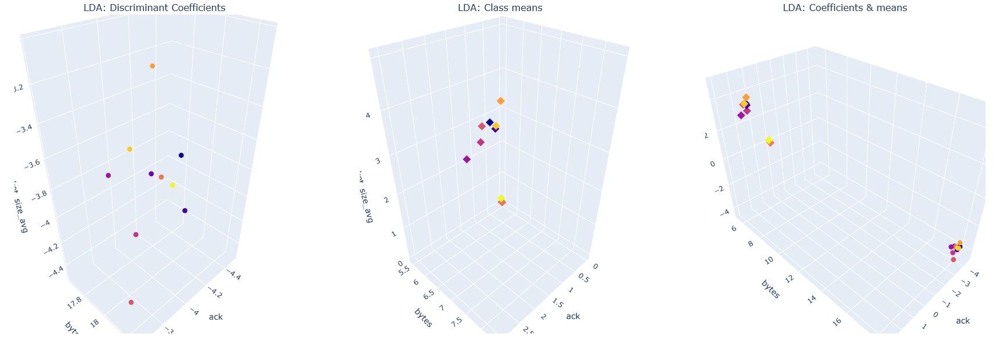

In [36]:
fig = make_subplots(
    rows = 1, cols = 3,
    specs = [[{"type": "scene"}, {"type": "scene"}, {"type": "scene"}]],
    subplot_titles = ("LDA: Discriminant Coefficients", "LDA: Class means",
                      "LDA: Coefficients & means")
)

# --- Discriminant Coefficients only
fig.add_trace(
    go.Scatter3d(x = lda_coefs["ack"],
                 y = lda_coefs["bytes"],
                 z = lda_coefs["packet_size_avg"],
                 mode = "markers",
                 marker_size = 5,
                 marker_color = lda_coefs["ENC_CLASS"]),
    row = 1, col = 1
)

# --- Class Means only
fig.add_trace(
    go.Scatter3d(x = lda_means["ack"],
                 y = lda_means["bytes"],
                 z = lda_means["packet_size_avg"],
                 mode = "markers",
                 marker_symbol = "diamond",
                 marker_size = 5,
                 marker_color = lda_coefs["ENC_CLASS"]),
    row = 1, col = 2
)

# --- Coefficients & Means
fig.add_trace(
    go.Scatter3d(x = lda_coefs["ack"],
                 y = lda_coefs["bytes"],
                 z = lda_coefs["packet_size_avg"],
                 mode = "markers",
                 marker_size = 5,
                 marker_color = lda_coefs["ENC_CLASS"]),
    row = 1, col = 3,
)

fig.add_trace(
    go.Scatter3d(x = lda_means["ack"],
                 y = lda_means["bytes"],
                 z = lda_means["packet_size_avg"],
                 mode = "markers",
                 marker_symbol = "diamond",
                 marker_size = 5,
                 marker_color = lda_coefs["ENC_CLASS"]),
    row = 1, col = 3
)

# --- Final formatting
fig.update_layout(
    height = 600, showlegend = False,
    scene1 = dict(xaxis_title = "ack",
                  yaxis_title = "bytes",
                  zaxis_title = "packet_size_avg"),
    scene2 = dict(xaxis_title = "ack",
                  yaxis_title = "bytes",
                  zaxis_title = "packet_size_avg"),
    scene3 = dict(xaxis_title = "ack",
                  yaxis_title = "bytes",
                  zaxis_title = "packet_size_avg"),
    margin = go.layout.Margin(l = 25,
                              r = 25,
                              b = 25,
                              t = 25)
)
fig.show()

Mighty interesting, our classes appear to have been very nicely separated by our discriminants, and although our class means seem to be bunched up quite closely together they are still very much separable from the perspective of our discriminants. Now that we have this kind of an understanding of what our LDA has done, we can validate it.

#### LDA Validation

In [37]:
lda_final_preds = gscv_lda.best_estimator_.predict(ftest_X[X_train.columns])
print("### LDA VALIDATION ###")
print("-------------------------")
print("Final result: ", balanced_accuracy_score(ftest_y_le, lda_final_preds),
      "\t({:.2f}%)".format(balanced_accuracy_score(ftest_y_le, lda_final_preds) * 100))

### LDA VALIDATION ###
-------------------------
Final result:  0.8744444444444445 	(87.44%)


Great, our LDA has generalised to unseen data with an accuracy of 87.44%. It's actually quite amazing seeing the math in action, but an even more impressive feat would be deconstructing QDA.

### 1.2: Quadratic DA
QDA is almost the exact same as LDA with the exception being that QDA does not assume that all of the target classes share the same covariance, and so will instead calculate covariance matrices for each class. In other words, LDA assumes that the observations within each class are drawn from a multivariate Gaussian distribution with a class-specific mean vector (each class has its own mean), but a covariance matrix that is common to all K classes (every class has the same covariance; the classes share a covariance matrix). QDA instead assumes that each class has its own covariance matrix. All the other assumptions are the same (QDA also assumes that the data is normally distributed).

The only valid parameter to tune here is the amount of regularisation we want.

In [38]:
qda_params = [{'reg_param': [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7]}]
qda = QuadraticDiscriminantAnalysis(store_covariance = True)

gscv_qda = GridSearchCV(estimator = qda,
                        param_grid = qda_params,
                        n_jobs = -3,
                        cv = 5,
                        scoring = "balanced_accuracy")

In [39]:
%time gscv_qda.fit(X = X_train, y = y_train_le)
pred_train_qda = gscv_qda.best_estimator_.predict(X_train)
pred_test_qda = gscv_qda.best_estimator_.predict(X_test)

print("\n### GRID SEARCH: QUADRATIC DISCRIMINANT ANALYSIS ###")
print("-------------------------")
print("Best estimator:\t\t", gscv_qda.best_estimator_, "\nBest score:\t\t", gscv_qda.best_score_,
      "\t({:.2f}%)".format(gscv_qda.best_score_ * 100))
print("Balanced accuracy train:", balanced_accuracy_score(y_train_le, pred_train_qda),
      "\t({:.2f}%)".format(balanced_accuracy_score(y_train_le, pred_train_qda) * 100))
print("Balanced accuracy test:\t", balanced_accuracy_score(y_test_le, pred_test_qda),
      "\t({:.2f}%)".format(balanced_accuracy_score(y_test_le, pred_test_qda) * 100))

CPU times: total: 781 ms
Wall time: 411 ms

### GRID SEARCH: QUADRATIC DISCRIMINANT ANALYSIS ###
-------------------------
Best estimator:		 QuadraticDiscriminantAnalysis(reg_param=0.1, store_covariance=True) 
Best score:		 0.7459544159544159 	(74.60%)
Balanced accuracy train: 0.7895522388059701 	(78.96%)
Balanced accuracy test:	 0.7696969696969698 	(76.97%)


#### QDA deconstruction
As with LDA, let's try to get an intuition into what our QDA is seeing, particularly with respect to the covariance matrices. Because QDA assumes every class has its own covariance matrix, the methodology used to generate discriminants and hence the decision boundaries becomes a quadratic one. Consequently there's no concept of dimensionality reduction here, at least in the linear sense (and as implemented in sklearn) versus methods such as LLE or Spectral Embedding. Note that the discriminant analysis stages remain the same as with LDA, the only difference is that the discriminants of each class (from the extraction stage) will be used with each class' own covariance matrix rather than a shared covariance matrix.

With QDA, since every class will have its own covariance matrix, the resulting array will be 3D of shape `(10, 222, 222)` or `(n_classes, n_features, n_features)`. Since looking at every single covariance matrix will not only be a waste of visual space, time, and most importantly computational memory, we'll just look at the first 3 classes' covariance matrices (`TV`, `baby_monitor` and `lights`). Since this isn't a linear method, we have no `coef_` or `intercept_`.

In [40]:
# --- Class: TV
qda_covar_tv= pd.DataFrame(gscv_qda.best_estimator_.covariance_[0],
                            columns = gscv_qda.best_estimator_.feature_names_in_)

print("QDA Covariance matrix for class: TV")
print("-------------------------")
with pd.option_context("display.max_columns", qda_covar_tv.shape[1]):
    display(qda_covar_tv.head())

# --- Class: baby_monitor
qda_covar_baby = pd.DataFrame(gscv_qda.best_estimator_.covariance_[1],
                              columns = gscv_qda.best_estimator_.feature_names_in_)

print("\nQDA Covariance matrix for class: baby_monitor")
print("-------------------------")
with pd.option_context("display.max_columns", qda_covar_baby.shape[1]):
    display(qda_covar_baby.head())
    
# --- Class: lights
qda_covar_lights = pd.DataFrame(gscv_qda.best_estimator_.covariance_[2],
                                columns = gscv_qda.best_estimator_.feature_names_in_)

print("\nQDA Covariance matrix for class: lights")
print("-------------------------")
with pd.option_context("display.max_columns", qda_covar_lights.shape[1]):
    display(qda_covar_baby.head())

QDA Covariance matrix for class: TV
-------------------------


,ack,ack_A,ack_B,bytes,bytes_A,bytes_A_B_ratio,bytes_B,ds_field_B,duration,http_bytes_avg,http_bytes_entropy,http_bytes_firstQ,http_bytes_max,http_bytes_median,http_bytes_min,http_bytes_stdev,http_bytes_sum,http_bytes_thirdQ,http_bytes_var,http_cookie_count,http_cookie_values_avg,http_cookie_values_firstQ,http_cookie_values_max,http_cookie_values_median,http_cookie_values_min,http_cookie_values_sum,http_cookie_values_thirdQ,http_count_resp_code,http_count_resp_content_type,http_count_transactions,http_dom_host_alexaRank,http_dom_resp_code,http_inter_arrivel_avg,http_inter_arrivel_entropy,http_inter_arrivel_firstQ,http_inter_arrivel_max,http_inter_arrivel_median,http_inter_arrivel_min,http_inter_arrivel_stdev,http_inter_arrivel_sum,http_inter_arrivel_thirdQ,http_inter_arrivel_var,http_req_bytes_avg,http_req_bytes_firstQ,http_req_bytes_max,http_req_bytes_median,http_req_bytes_min,http_req_bytes_sum,http_req_bytes_thirdQ,http_resp_bytes_avg,http_resp_bytes_entropy,http_resp_bytes_firstQ,http_resp_bytes_max,http_resp_bytes_median,http_resp_bytes_min,http_resp_bytes_stdev,http_resp_bytes_sum,http_resp_bytes_thirdQ,http_resp_bytes_var,http_time_avg,http_time_entropy,http_time_firstQ,http_time_max,http_time_median,http_time_min,http_time_stdev,http_time_sum,http_time_thirdQ,http_time_var,packet_inter_arrivel_A_avg,packet_inter_arrivel_A_entropy,packet_inter_arrivel_A_firstQ,packet_inter_arrivel_A_max,packet_inter_arrivel_A_median,packet_inter_arrivel_A_min,packet_inter_arrivel_A_stdev,packet_inter_arrivel_A_sum,packet_inter_arrivel_A_thirdQ,packet_inter_arrivel_A_var,packet_inter_arrivel_B_avg,packet_inter_arrivel_B_entropy,packet_inter_arrivel_B_firstQ,packet_inter_arrivel_B_max,packet_inter_arrivel_B_median,packet_inter_arrivel_B_min,packet_inter_arrivel_B_stdev,packet_inter_arrivel_B_sum,packet_inter_arrivel_B_thirdQ,packet_inter_arrivel_B_var,packet_inter_arrivel_avg,packet_inter_arrivel_entropy,packet_inter_arrivel_firstQ,packet_inter_arrivel_max,packet_inter_arrivel_median,packet_inter_arrivel_min,packet_inter_arrivel_stdev,packet_inter_arrivel_sum,packet_inter_arrivel_thirdQ,packet_inter_arrivel_var,packet_size_A_avg,packet_size_A_entropy,packet_size_A_firstQ,packet_size_A_max,packet_size_A_median,packet_size_A_min,packet_size_A_stdev,packet_size_A_sum,packet_size_A_thirdQ,packet_size_A_var,packet_size_B_avg,packet_size_B_entropy,packet_size_B_firstQ,packet_size_B_max,packet_size_B_median,packet_size_B_stdev,packet_size_B_sum,packet_size_B_thirdQ,packet_size_B_var,packet_size_avg,packet_size_entropy,packet_size_firstQ,packet_size_max,packet_size_median,packet_size_stdev,packet_size_sum,packet_size_thirdQ,packet_size_var,packets,packets_A,packets_A_B_ratio,packets_B,push,push_A,push_B,reset,reset_A,reset_B,ssl_count_certificates,ssl_count_client_cipher_algs,ssl_count_client_ciphersuites,ssl_count_client_elliptic_curves,ssl_count_client_key_exchange_algs,ssl_count_client_mac_algs,ssl_dom_server_ciphersuite,ssl_dom_server_name_alexaRank,ssl_dom_version,ssl_handshake_duration_avg,ssl_handshake_duration_firstQ,ssl_handshake_duration_max,ssl_handshake_duration_median,ssl_handshake_duration_min,ssl_handshake_duration_sum,ssl_handshake_duration_thirdQ,ssl_req_bytes_avg,ssl_req_bytes_entropy,ssl_req_bytes_firstQ,ssl_req_bytes_max,ssl_req_bytes_median,ssl_req_bytes_min,ssl_req_bytes_stdev,ssl_req_bytes_sum,ssl_req_bytes_thirdQ,ssl_req_bytes_var,ssl_resp_bytes_avg,ssl_resp_bytes_entropy,ssl_resp_bytes_firstQ,ssl_resp_bytes_max,ssl_resp_bytes_median,ssl_resp_bytes_min,ssl_resp_bytes_stdev,ssl_resp_bytes_sum,ssl_resp_bytes_thirdQ,ssl_resp_bytes_var,tcp_analysis_duplicate_ack,tcp_analysis_keep_alive,tcp_analysis_lost_segment,tcp_analysis_out_of_order,tcp_analysis_retransmission,tcp_analysis_reused_ports,ttl_A_avg,ttl_A_firstQ,ttl_A_max,ttl_A_median,ttl_A_min,ttl_A_sum,ttl_A_thirdQ,ttl_B_avg,ttl_B_entropy,ttl_B_firstQ,ttl_B_max,ttl_B_median,ttl_B_min,ttl_B_stdev,ttl_B_sum,ttl_B_thirdQ,ttl_B_var,ttl_avg,ttl_entropy,ttl_firstQ,ttl_max,ttl_medi


QDA Covariance matrix for class: baby_monitor
-------------------------


,ack,ack_A,ack_B,bytes,bytes_A,bytes_A_B_ratio,bytes_B,ds_field_B,duration,http_bytes_avg,http_bytes_entropy,http_bytes_firstQ,http_bytes_max,http_bytes_median,http_bytes_min,http_bytes_stdev,http_bytes_sum,http_bytes_thirdQ,http_bytes_var,http_cookie_count,http_cookie_values_avg,http_cookie_values_firstQ,http_cookie_values_max,http_cookie_values_median,http_cookie_values_min,http_cookie_values_sum,http_cookie_values_thirdQ,http_count_resp_code,http_count_resp_content_type,http_count_transactions,http_dom_host_alexaRank,http_dom_resp_code,http_inter_arrivel_avg,http_inter_arrivel_entropy,http_inter_arrivel_firstQ,http_inter_arrivel_max,http_inter_arrivel_median,http_inter_arrivel_min,http_inter_arrivel_stdev,http_inter_arrivel_sum,http_inter_arrivel_thirdQ,http_inter_arrivel_var,http_req_bytes_avg,http_req_bytes_firstQ,http_req_bytes_max,http_req_bytes_median,http_req_bytes_min,http_req_bytes_sum,http_req_bytes_thirdQ,http_resp_bytes_avg,http_resp_bytes_entropy,http_resp_bytes_firstQ,http_resp_bytes_max,http_resp_bytes_median,http_resp_bytes_min,http_resp_bytes_stdev,http_resp_bytes_sum,http_resp_bytes_thirdQ,http_resp_bytes_var,http_time_avg,http_time_entropy,http_time_firstQ,http_time_max,http_time_median,http_time_min,http_time_stdev,http_time_sum,http_time_thirdQ,http_time_var,packet_inter_arrivel_A_avg,packet_inter_arrivel_A_entropy,packet_inter_arrivel_A_firstQ,packet_inter_arrivel_A_max,packet_inter_arrivel_A_median,packet_inter_arrivel_A_min,packet_inter_arrivel_A_stdev,packet_inter_arrivel_A_sum,packet_inter_arrivel_A_thirdQ,packet_inter_arrivel_A_var,packet_inter_arrivel_B_avg,packet_inter_arrivel_B_entropy,packet_inter_arrivel_B_firstQ,packet_inter_arrivel_B_max,packet_inter_arrivel_B_median,packet_inter_arrivel_B_min,packet_inter_arrivel_B_stdev,packet_inter_arrivel_B_sum,packet_inter_arrivel_B_thirdQ,packet_inter_arrivel_B_var,packet_inter_arrivel_avg,packet_inter_arrivel_entropy,packet_inter_arrivel_firstQ,packet_inter_arrivel_max,packet_inter_arrivel_median,packet_inter_arrivel_min,packet_inter_arrivel_stdev,packet_inter_arrivel_sum,packet_inter_arrivel_thirdQ,packet_inter_arrivel_var,packet_size_A_avg,packet_size_A_entropy,packet_size_A_firstQ,packet_size_A_max,packet_size_A_median,packet_size_A_min,packet_size_A_stdev,packet_size_A_sum,packet_size_A_thirdQ,packet_size_A_var,packet_size_B_avg,packet_size_B_entropy,packet_size_B_firstQ,packet_size_B_max,packet_size_B_median,packet_size_B_stdev,packet_size_B_sum,packet_size_B_thirdQ,packet_size_B_var,packet_size_avg,packet_size_entropy,packet_size_firstQ,packet_size_max,packet_size_median,packet_size_stdev,packet_size_sum,packet_size_thirdQ,packet_size_var,packets,packets_A,packets_A_B_ratio,packets_B,push,push_A,push_B,reset,reset_A,reset_B,ssl_count_certificates,ssl_count_client_cipher_algs,ssl_count_client_ciphersuites,ssl_count_client_elliptic_curves,ssl_count_client_key_exchange_algs,ssl_count_client_mac_algs,ssl_dom_server_ciphersuite,ssl_dom_server_name_alexaRank,ssl_dom_version,ssl_handshake_duration_avg,ssl_handshake_duration_firstQ,ssl_handshake_duration_max,ssl_handshake_duration_median,ssl_handshake_duration_min,ssl_handshake_duration_sum,ssl_handshake_duration_thirdQ,ssl_req_bytes_avg,ssl_req_bytes_entropy,ssl_req_bytes_firstQ,ssl_req_bytes_max,ssl_req_bytes_median,ssl_req_bytes_min,ssl_req_bytes_stdev,ssl_req_bytes_sum,ssl_req_bytes_thirdQ,ssl_req_bytes_var,ssl_resp_bytes_avg,ssl_resp_bytes_entropy,ssl_resp_bytes_firstQ,ssl_resp_bytes_max,ssl_resp_bytes_median,ssl_resp_bytes_min,ssl_resp_bytes_stdev,ssl_resp_bytes_sum,ssl_resp_bytes_thirdQ,ssl_resp_bytes_var,tcp_analysis_duplicate_ack,tcp_analysis_keep_alive,tcp_analysis_lost_segment,tcp_analysis_out_of_order,tcp_analysis_retransmission,tcp_analysis_reused_ports,ttl_A_avg,ttl_A_firstQ,ttl_A_max,ttl_A_median,ttl_A_min,ttl_A_sum,ttl_A_thirdQ,ttl_B_avg,ttl_B_entropy,ttl_B_firstQ,ttl_B_max,ttl_B_median,ttl_B_min,ttl_B_stdev,ttl_B_sum,ttl_B_thirdQ,ttl_B_var,ttl_avg,ttl_entropy,ttl_firstQ,ttl_max,ttl_medi


QDA Covariance matrix for class: lights
-------------------------


,ack,ack_A,ack_B,bytes,bytes_A,bytes_A_B_ratio,bytes_B,ds_field_B,duration,http_bytes_avg,http_bytes_entropy,http_bytes_firstQ,http_bytes_max,http_bytes_median,http_bytes_min,http_bytes_stdev,http_bytes_sum,http_bytes_thirdQ,http_bytes_var,http_cookie_count,http_cookie_values_avg,http_cookie_values_firstQ,http_cookie_values_max,http_cookie_values_median,http_cookie_values_min,http_cookie_values_sum,http_cookie_values_thirdQ,http_count_resp_code,http_count_resp_content_type,http_count_transactions,http_dom_host_alexaRank,http_dom_resp_code,http_inter_arrivel_avg,http_inter_arrivel_entropy,http_inter_arrivel_firstQ,http_inter_arrivel_max,http_inter_arrivel_median,http_inter_arrivel_min,http_inter_arrivel_stdev,http_inter_arrivel_sum,http_inter_arrivel_thirdQ,http_inter_arrivel_var,http_req_bytes_avg,http_req_bytes_firstQ,http_req_bytes_max,http_req_bytes_median,http_req_bytes_min,http_req_bytes_sum,http_req_bytes_thirdQ,http_resp_bytes_avg,http_resp_bytes_entropy,http_resp_bytes_firstQ,http_resp_bytes_max,http_resp_bytes_median,http_resp_bytes_min,http_resp_bytes_stdev,http_resp_bytes_sum,http_resp_bytes_thirdQ,http_resp_bytes_var,http_time_avg,http_time_entropy,http_time_firstQ,http_time_max,http_time_median,http_time_min,http_time_stdev,http_time_sum,http_time_thirdQ,http_time_var,packet_inter_arrivel_A_avg,packet_inter_arrivel_A_entropy,packet_inter_arrivel_A_firstQ,packet_inter_arrivel_A_max,packet_inter_arrivel_A_median,packet_inter_arrivel_A_min,packet_inter_arrivel_A_stdev,packet_inter_arrivel_A_sum,packet_inter_arrivel_A_thirdQ,packet_inter_arrivel_A_var,packet_inter_arrivel_B_avg,packet_inter_arrivel_B_entropy,packet_inter_arrivel_B_firstQ,packet_inter_arrivel_B_max,packet_inter_arrivel_B_median,packet_inter_arrivel_B_min,packet_inter_arrivel_B_stdev,packet_inter_arrivel_B_sum,packet_inter_arrivel_B_thirdQ,packet_inter_arrivel_B_var,packet_inter_arrivel_avg,packet_inter_arrivel_entropy,packet_inter_arrivel_firstQ,packet_inter_arrivel_max,packet_inter_arrivel_median,packet_inter_arrivel_min,packet_inter_arrivel_stdev,packet_inter_arrivel_sum,packet_inter_arrivel_thirdQ,packet_inter_arrivel_var,packet_size_A_avg,packet_size_A_entropy,packet_size_A_firstQ,packet_size_A_max,packet_size_A_median,packet_size_A_min,packet_size_A_stdev,packet_size_A_sum,packet_size_A_thirdQ,packet_size_A_var,packet_size_B_avg,packet_size_B_entropy,packet_size_B_firstQ,packet_size_B_max,packet_size_B_median,packet_size_B_stdev,packet_size_B_sum,packet_size_B_thirdQ,packet_size_B_var,packet_size_avg,packet_size_entropy,packet_size_firstQ,packet_size_max,packet_size_median,packet_size_stdev,packet_size_sum,packet_size_thirdQ,packet_size_var,packets,packets_A,packets_A_B_ratio,packets_B,push,push_A,push_B,reset,reset_A,reset_B,ssl_count_certificates,ssl_count_client_cipher_algs,ssl_count_client_ciphersuites,ssl_count_client_elliptic_curves,ssl_count_client_key_exchange_algs,ssl_count_client_mac_algs,ssl_dom_server_ciphersuite,ssl_dom_server_name_alexaRank,ssl_dom_version,ssl_handshake_duration_avg,ssl_handshake_duration_firstQ,ssl_handshake_duration_max,ssl_handshake_duration_median,ssl_handshake_duration_min,ssl_handshake_duration_sum,ssl_handshake_duration_thirdQ,ssl_req_bytes_avg,ssl_req_bytes_entropy,ssl_req_bytes_firstQ,ssl_req_bytes_max,ssl_req_bytes_median,ssl_req_bytes_min,ssl_req_bytes_stdev,ssl_req_bytes_sum,ssl_req_bytes_thirdQ,ssl_req_bytes_var,ssl_resp_bytes_avg,ssl_resp_bytes_entropy,ssl_resp_bytes_firstQ,ssl_resp_bytes_max,ssl_resp_bytes_median,ssl_resp_bytes_min,ssl_resp_bytes_stdev,ssl_resp_bytes_sum,ssl_resp_bytes_thirdQ,ssl_resp_bytes_var,tcp_analysis_duplicate_ack,tcp_analysis_keep_alive,tcp_analysis_lost_segment,tcp_analysis_out_of_order,tcp_analysis_retransmission,tcp_analysis_reused_ports,ttl_A_avg,ttl_A_firstQ,ttl_A_max,ttl_A_median,ttl_A_min,ttl_A_sum,ttl_A_thirdQ,ttl_B_avg,ttl_B_entropy,ttl_B_firstQ,ttl_B_max,ttl_B_median,ttl_B_min,ttl_B_stdev,ttl_B_sum,ttl_B_thirdQ,ttl_B_var,ttl_avg,ttl_entropy,ttl_firstQ,ttl_max,ttl_medi

We can clearly see the difference in approaches of the two methods and how the change in the covariances can influence the discriminants and hence the decision boundaries. Let's have a look at our class means as well, which should be the exact same as our LDA class means. Recall that class means are used during the classification stage of discriminant analysis in conjunction with class covariances.

In [41]:
qda_means = pd.DataFrame(gscv_qda.best_estimator_.means_,
                         columns = gscv_qda.best_estimator_.feature_names_in_)

# again, this isn't linear anymore so we don't have an intercept
qda_means["ENC_CLASS"] = gscv_qda.best_estimator_.classes_
qda_means["STR_CLASS"] = check.sort_values(by = "lenc")["dev_cat"].values

with pd.option_context("display.max_columns", qda_means.shape[1]):
    display(qda_means)

print("\nqda_means == lda_means?: ", qda_means.equals(lda_means))

,ack,ack_A,ack_B,bytes,bytes_A,bytes_A_B_ratio,bytes_B,ds_field_B,duration,http_bytes_avg,http_bytes_entropy,http_bytes_firstQ,http_bytes_max,http_bytes_median,http_bytes_min,http_bytes_stdev,http_bytes_sum,http_bytes_thirdQ,http_bytes_var,http_cookie_count,http_cookie_values_avg,http_cookie_values_firstQ,http_cookie_values_max,http_cookie_values_median,http_cookie_values_min,http_cookie_values_sum,http_cookie_values_thirdQ,http_count_resp_code,http_count_resp_content_type,http_count_transactions,http_dom_host_alexaRank,http_dom_resp_code,http_inter_arrivel_avg,http_inter_arrivel_entropy,http_inter_arrivel_firstQ,http_inter_arrivel_max,http_inter_arrivel_median,http_inter_arrivel_min,http_inter_arrivel_stdev,http_inter_arrivel_sum,http_inter_arrivel_thirdQ,http_inter_arrivel_var,http_req_bytes_avg,http_req_bytes_firstQ,http_req_bytes_max,http_req_bytes_median,http_req_bytes_min,http_req_bytes_sum,http_req_bytes_thirdQ,http_resp_bytes_avg,http_resp_bytes_entropy,http_resp_bytes_firstQ,http_resp_bytes_max,http_resp_bytes_median,http_resp_bytes_min,http_resp_bytes_stdev,http_resp_bytes_sum,http_resp_bytes_thirdQ,http_resp_bytes_var,http_time_avg,http_time_entropy,http_time_firstQ,http_time_max,http_time_median,http_time_min,http_time_stdev,http_time_sum,http_time_thirdQ,http_time_var,packet_inter_arrivel_A_avg,packet_inter_arrivel_A_entropy,packet_inter_arrivel_A_firstQ,packet_inter_arrivel_A_max,packet_inter_arrivel_A_median,packet_inter_arrivel_A_min,packet_inter_arrivel_A_stdev,packet_inter_arrivel_A_sum,packet_inter_arrivel_A_thirdQ,packet_inter_arrivel_A_var,packet_inter_arrivel_B_avg,packet_inter_arrivel_B_entropy,packet_inter_arrivel_B_firstQ,packet_inter_arrivel_B_max,packet_inter_arrivel_B_median,packet_inter_arrivel_B_min,packet_inter_arrivel_B_stdev,packet_inter_arrivel_B_sum,packet_inter_arrivel_B_thirdQ,packet_inter_arrivel_B_var,packet_inter_arrivel_avg,packet_inter_arrivel_entropy,packet_inter_arrivel_firstQ,packet_inter_arrivel_max,packet_inter_arrivel_median,packet_inter_arrivel_min,packet_inter_arrivel_stdev,packet_inter_arrivel_sum,packet_inter_arrivel_thirdQ,packet_inter_arrivel_var,packet_size_A_avg,packet_size_A_entropy,packet_size_A_firstQ,packet_size_A_max,packet_size_A_median,packet_size_A_min,packet_size_A_stdev,packet_size_A_sum,packet_size_A_thirdQ,packet_size_A_var,packet_size_B_avg,packet_size_B_entropy,packet_size_B_firstQ,packet_size_B_max,packet_size_B_median,packet_size_B_stdev,packet_size_B_sum,packet_size_B_thirdQ,packet_size_B_var,packet_size_avg,packet_size_entropy,packet_size_firstQ,packet_size_max,packet_size_median,packet_size_stdev,packet_size_sum,packet_size_thirdQ,packet_size_var,packets,packets_A,packets_A_B_ratio,packets_B,push,push_A,push_B,reset,reset_A,reset_B,ssl_count_certificates,ssl_count_client_cipher_algs,ssl_count_client_ciphersuites,ssl_count_client_elliptic_curves,ssl_count_client_key_exchange_algs,ssl_count_client_mac_algs,ssl_dom_server_ciphersuite,ssl_dom_server_name_alexaRank,ssl_dom_version,ssl_handshake_duration_avg,ssl_handshake_duration_firstQ,ssl_handshake_duration_max,ssl_handshake_duration_median,ssl_handshake_duration_min,ssl_handshake_duration_sum,ssl_handshake_duration_thirdQ,ssl_req_bytes_avg,ssl_req_bytes_entropy,ssl_req_bytes_firstQ,ssl_req_bytes_max,ssl_req_bytes_median,ssl_req_bytes_min,ssl_req_bytes_stdev,ssl_req_bytes_sum,ssl_req_bytes_thirdQ,ssl_req_bytes_var,ssl_resp_bytes_avg,ssl_resp_bytes_entropy,ssl_resp_bytes_firstQ,ssl_resp_bytes_max,ssl_resp_bytes_median,ssl_resp_bytes_min,ssl_resp_bytes_stdev,ssl_resp_bytes_sum,ssl_resp_bytes_thirdQ,ssl_resp_bytes_var,tcp_analysis_duplicate_ack,tcp_analysis_keep_alive,tcp_analysis_lost_segment,tcp_analysis_out_of_order,tcp_analysis_retransmission,tcp_analysis_reused_ports,ttl_A_avg,ttl_A_firstQ,ttl_A_max,ttl_A_median,ttl_A_min,ttl_A_sum,ttl_A_thirdQ,ttl_B_avg,ttl_B_entropy,ttl_B_firstQ,ttl_B_max,ttl_B_median,ttl_B_min,ttl_B_stdev,ttl_B_sum,ttl_B_thirdQ,ttl_B_var,ttl_avg,ttl_entropy,ttl_firstQ,ttl_max,ttl_medi


qda_means == lda_means?:  True


And as expected, our class means are exactly the same. The lack of the shared covariance assumption results in QDA being a more flexible classifier with higher variance and reduced bias, meaning that it should be able to generalise much better to unseen data (within reason.) Let's verify this by validating our QDA model.

#### QDA Validation

In [42]:
qda_final_preds = gscv_qda.best_estimator_.predict(ftest_X[X_test.columns])
print("### QDA VALIDATION ###")
print("-------------------------")
print("Final result: ", balanced_accuracy_score(ftest_y_le, qda_final_preds),
      "\t({:.2f}%)".format(balanced_accuracy_score(ftest_y_le, qda_final_preds) * 100))

### QDA VALIDATION ###
-------------------------
Final result:  0.9022222222222221 	(90.22%)


And it looks like it very much did indeed generalise better to unseen data with a validation score of 90.22%. While Discriminant Analysis is an absolutely stunning piece of work mathematically and extremely useful both as a dimensionality reduction technique and as a classifier, there are a few downsides to it:
1. There is no concept of "feature importances" which means attempting to identify which features contribute more to a certain classification decision is irrelevant (it would come down to how do we define "importance" in the context of DA.)
2. It is very much possible for LDA to fail in linearly separating the data when it is truly not linearly separable. In this scenario, even the dimensionality reduction capabilites of LDA won't suffice because its discriminants are calculated using a linear combination of variables. QDA can fail if our data isn't separable in a quadratic dimension either.
3. Both methods fail if the data hasn't been drawn from a normal distribution.

Interestingly enough, both methods can be seen as extensions to the Naive Bayes classifier, and LDA is simply a special case of QDA where all classes have the same covariance. Anyway, both discriminant analyses performed astoundingly well so far, but let's see if we can eke out some more predictive juice using some slightly more complicated classifiers.

## Model 2: SVC (GridSearch)
Although our data was nicely linearly separated by our DA, it should be known that in the case of non-linear separability, an SVC with a linear kernel is the only method capable of classifying such data. This is simply because as the data is projected into higher dimensions using the good ol' kernel trick (we simply multiply our feature by itself as many times as it takes to achieve a linear fit against the target), at some point there will be a dimension where our data is linearly separable. The downside is that class weights according to the SVC will be applicable in this higher dimension, so visualising a lower-dimensional result is slightly tricky. Additionally, this mathematical approach is very computationally expensive (specifically, sklearn's SVC solves an optimisation problem (interestingly enough: LDA has an analytical solution) which scales up to O(n^3) complexity) and hence should be done carefully.

As mentioned earlier, SVC is heavily affected by unscaled data due to its mathematical complexity, so we'll be using `MinMaxScaler()` for this for the following reasons:
1. StandardScaler() standardises data to have `0` mean and unit variance (z-scoring data removes the mean). This is great but it assumes the data is normally distributed which a good portion of our data isn't. Standardising it will emphasise our abnormally distributed data and will also not contribute much to restricting our decision boundary to small enough values.
2. RobustScaler(), although exceptionally awesome because it uses the median instead of the mean and is unaffected by outliers, compounds the abnormal distribution even more and also results in even larger values for outliers.
3. MinMaxScaler() scales data to unit variance (normalises the data) which addresses outliers, doesn't emphasise abnormal distributions and restricts our decision boundary to `[-1, 1]` (default = `[0, 1]`). This will help our SVM tremendously by easing its computational burden.

The difference in scales will be demonstrated with graphs, but the SVM will be run after normalising.

Standardised & Scaled (z-score):
------------------------------


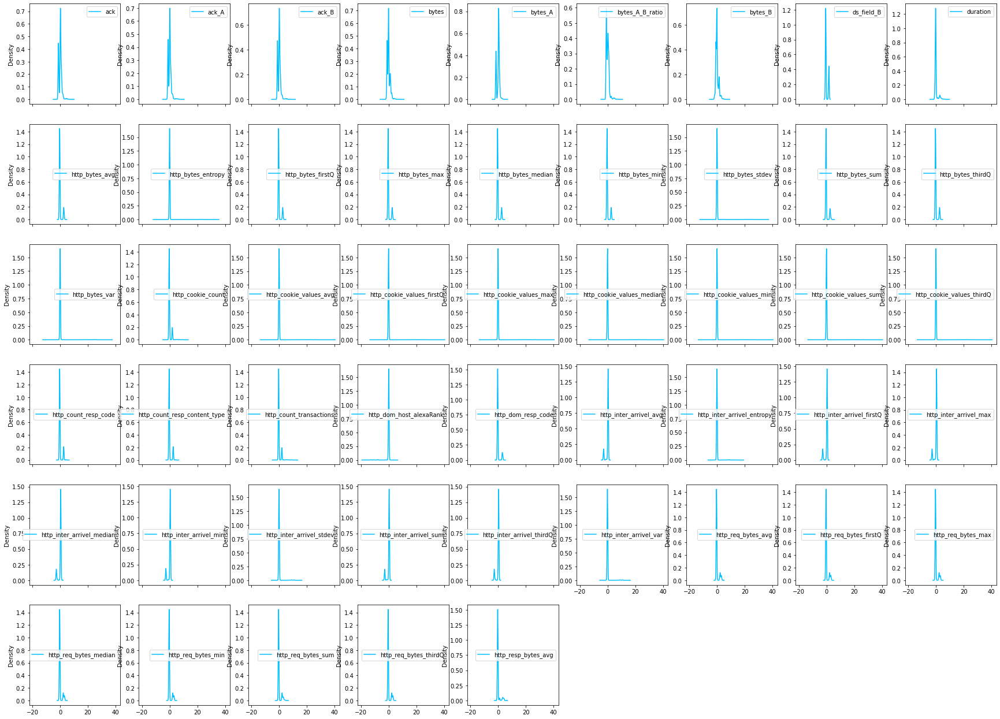

In [43]:
std_scale = StandardScaler()

std_scale.fit(X_train)
X_train_std = std_scale.transform(X_train)
X_test_std = std_scale.transform(X_test)

print("Standardised & Scaled (z-score):")
print("------------------------------")
(pd.DataFrame(X_train_std,
              columns = X_train.columns)).iloc[:, :50].plot.kde(subplots = True,
                                                                figsize = (30, 30),
                                                                layout = (8, 9),
                                                                color = "deepskyblue");

Robustly Standardised & Scaled:
------------------------------


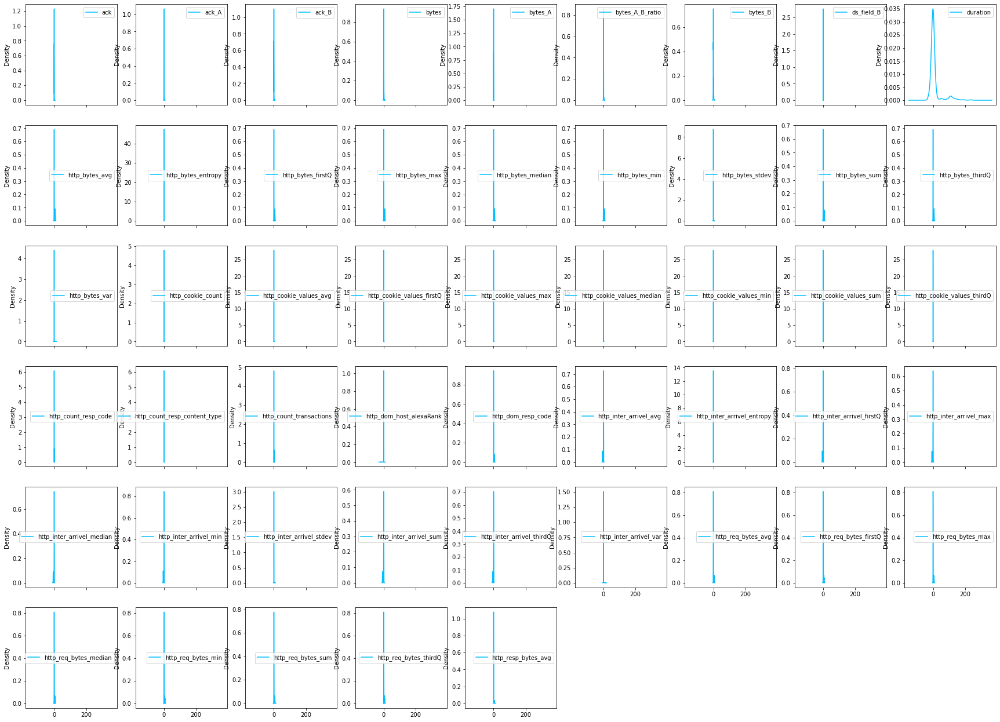

In [44]:
rob_scale = RobustScaler()

rob_scale.fit(X_train)
X_train_rob = rob_scale.transform(X_train)
X_test_rob = rob_scale.transform(X_test)


print("Robustly Standardised & Scaled:")
print("------------------------------")
(pd.DataFrame(X_train_rob,
              columns = X_train.columns)).iloc[:, :50].plot.kde(subplots = True,
                                                                figsize = (30, 30),
                                                                layout = (8, 9),
                                                                color = "deepskyblue");

Normalised & Scaled (minmaxed):
------------------------------


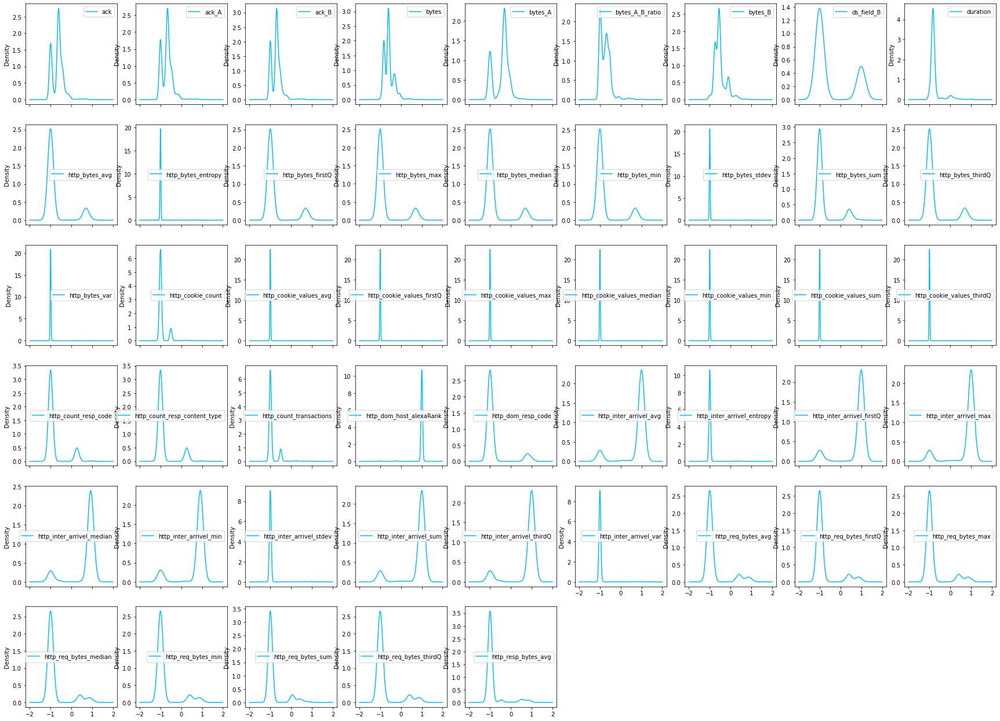

In [45]:
mmx_scale = MinMaxScaler(feature_range = (-1, 1))

mmx_scale.fit(X_train)
X_train_mmx = mmx_scale.transform(X_train)
X_test_mmx = mmx_scale.transform(X_test)

print("Normalised & Scaled (minmaxed):")
print("------------------------------")
(pd.DataFrame(X_train_mmx,
              columns = X_train.columns)).iloc[:, :50].plot.kde(subplots = True,
                                                                figsize = (30, 30),
                                                                layout = (8, 9),
                                                                color = "deepskyblue");

In [46]:
svc_params = [{"C": [0.001, 0.01, 0.1, 1, 2, 5, 10],
               "kernel": ["linear", "rbf", "sigmoid", "poly"],
               "degree": [1, 2, 3, 4, 5, 6],
               "gamma": ["scale", "auto"],
               "decision_function_shape": ["ovr", "ovo"],
               "random_state": [1337]}]
# for some reason initialising SVC() with random_state = 1337 is slower and
# will hang around half way.
svc = SVC()

gscv_svc = GridSearchCV(estimator = svc,
                        param_grid = svc_params,
                        n_jobs = -3,
                        cv = 5,
                        scoring = "balanced_accuracy",
                        verbose = 3)

In [47]:
%time gscv_svc.fit(X = X_train_mmx, y = y_train_le)
pred_train_mmx = gscv_svc.best_estimator_.predict(X_train_mmx)
pred_test_mmx = gscv_svc.best_estimator_.predict(X_test_mmx)

print("\n### GRID SEARCH: SUPPORT VECTOR CLASSIFIER MINMAXED ###")
print("-------------------------")
print("Best estimator:\t\t", gscv_svc.best_estimator_, "\nBest score:\t\t", gscv_svc.best_score_,
      "\t({:.2f}%)".format(gscv_svc.best_score_ * 100))
print("Balanced accuracy train:", balanced_accuracy_score(y_train_le, pred_train_mmx),
      "\t({:.2f}%)".format(balanced_accuracy_score(y_train_le, pred_train_mmx) * 100))
print("Balanced accuracy test:\t", balanced_accuracy_score(y_test_le, pred_test_mmx),
      "\t({:.2f}%)".format(balanced_accuracy_score(y_test_le, pred_test_mmx) * 100))

Fitting 5 folds for each of 672 candidates, totalling 3360 fits
CPU times: total: 3.5 s
Wall time: 42 s

### GRID SEARCH: SUPPORT VECTOR CLASSIFIER MINMAXED ###
-------------------------
Best estimator:		 SVC(C=10, degree=1, kernel='linear', random_state=1337) 
Best score:		 0.8202767602767602 	(82.03%)
Balanced accuracy train: 0.8559701492537313 	(85.60%)
Balanced accuracy test:	 0.8378787878787879 	(83.79%)


#### SVC deconstruction
We know that SVMs work by first attempting to find a hyperplane between separable classes (in our case it'll be OVR) in a linear fashion before projecting onto higher dimensions using a kernel trick. These kernel methods avoid the computation required to get an algorithm to learn a non-linear function or decision boundary, much like (for example) `pd.get_dummies()` doesn't learn the encoding of a certain dataset like `OHE()` does. Instead, kernel methods simply express a feature in a higher dimension using the inner product of that feature.

For the SVC's decision "line" to exist, there are coefficients (class weights) and intercepts. The coefficients represent the separation hyperplane for each class (versus the rest), essentially giving us the coorindates of vectors which are orthogonal to the decision hyperplane. The sign of the weight indicates which side of the decision boundary the data point is (Class 1 or Class Not 1), and the weights themselves can help identify feature importances in the sense that their magnitude determines how much they contribute to the orthogonality of the decision plane for that specific class. The weights will be of the form `(n_classes * (n_classes - 1) / 2, n_features)` because as with all sklearn classifiers, multiclass classification is done on a OVR basis (and our best grid search estimator has a OVR decision function.)

The intercepts tell us where, for each of the class decision boundaries, our hyperplane's axial intercepts lie. This will also be of the form (n_classes * (n_classes - 1) / 2, ) because again, we have an OVR classifier against 10 classes ((10 * 9) / 2).

In [48]:
svc_coefs = pd.DataFrame(gscv_svc.best_estimator_.coef_,
                         columns = X_train.columns)
svc_coefs["INTERCEPT"] = gscv_svc.best_estimator_.intercept_

with pd.option_context("display.max_columns", svc_coefs.shape[1]):
    display(svc_coefs.head(10))
    print("{} rows × {} columns"
          .format(svc_coefs.shape[0], svc_coefs.shape[1]))

,ack,ack_A,ack_B,bytes,bytes_A,bytes_A_B_ratio,bytes_B,ds_field_B,duration,http_bytes_avg,http_bytes_entropy,http_bytes_firstQ,http_bytes_max,http_bytes_median,http_bytes_min,http_bytes_stdev,http_bytes_sum,http_bytes_thirdQ,http_bytes_var,http_cookie_count,http_cookie_values_avg,http_cookie_values_firstQ,http_cookie_values_max,http_cookie_values_median,http_cookie_values_min,http_cookie_values_sum,http_cookie_values_thirdQ,http_count_resp_code,http_count_resp_content_type,http_count_transactions,http_dom_host_alexaRank,http_dom_resp_code,http_inter_arrivel_avg,http_inter_arrivel_entropy,http_inter_arrivel_firstQ,http_inter_arrivel_max,http_inter_arrivel_median,http_inter_arrivel_min,http_inter_arrivel_stdev,http_inter_arrivel_sum,http_inter_arrivel_thirdQ,http_inter_arrivel_var,http_req_bytes_avg,http_req_bytes_firstQ,http_req_bytes_max,http_req_bytes_median,http_req_bytes_min,http_req_bytes_sum,http_req_bytes_thirdQ,http_resp_bytes_avg,http_resp_bytes_entropy,http_resp_bytes_firstQ,http_resp_bytes_max,http_resp_bytes_median,http_resp_bytes_min,http_resp_bytes_stdev,http_resp_bytes_sum,http_resp_bytes_thirdQ,http_resp_bytes_var,http_time_avg,http_time_entropy,http_time_firstQ,http_time_max,http_time_median,http_time_min,http_time_stdev,http_time_sum,http_time_thirdQ,http_time_var,packet_inter_arrivel_A_avg,packet_inter_arrivel_A_entropy,packet_inter_arrivel_A_firstQ,packet_inter_arrivel_A_max,packet_inter_arrivel_A_median,packet_inter_arrivel_A_min,packet_inter_arrivel_A_stdev,packet_inter_arrivel_A_sum,packet_inter_arrivel_A_thirdQ,packet_inter_arrivel_A_var,packet_inter_arrivel_B_avg,packet_inter_arrivel_B_entropy,packet_inter_arrivel_B_firstQ,packet_inter_arrivel_B_max,packet_inter_arrivel_B_median,packet_inter_arrivel_B_min,packet_inter_arrivel_B_stdev,packet_inter_arrivel_B_sum,packet_inter_arrivel_B_thirdQ,packet_inter_arrivel_B_var,packet_inter_arrivel_avg,packet_inter_arrivel_entropy,packet_inter_arrivel_firstQ,packet_inter_arrivel_max,packet_inter_arrivel_median,packet_inter_arrivel_min,packet_inter_arrivel_stdev,packet_inter_arrivel_sum,packet_inter_arrivel_thirdQ,packet_inter_arrivel_var,packet_size_A_avg,packet_size_A_entropy,packet_size_A_firstQ,packet_size_A_max,packet_size_A_median,packet_size_A_min,packet_size_A_stdev,packet_size_A_sum,packet_size_A_thirdQ,packet_size_A_var,packet_size_B_avg,packet_size_B_entropy,packet_size_B_firstQ,packet_size_B_max,packet_size_B_median,packet_size_B_stdev,packet_size_B_sum,packet_size_B_thirdQ,packet_size_B_var,packet_size_avg,packet_size_entropy,packet_size_firstQ,packet_size_max,packet_size_median,packet_size_stdev,packet_size_sum,packet_size_thirdQ,packet_size_var,packets,packets_A,packets_A_B_ratio,packets_B,push,push_A,push_B,reset,reset_A,reset_B,ssl_count_certificates,ssl_count_client_cipher_algs,ssl_count_client_ciphersuites,ssl_count_client_elliptic_curves,ssl_count_client_key_exchange_algs,ssl_count_client_mac_algs,ssl_dom_server_ciphersuite,ssl_dom_server_name_alexaRank,ssl_dom_version,ssl_handshake_duration_avg,ssl_handshake_duration_firstQ,ssl_handshake_duration_max,ssl_handshake_duration_median,ssl_handshake_duration_min,ssl_handshake_duration_sum,ssl_handshake_duration_thirdQ,ssl_req_bytes_avg,ssl_req_bytes_entropy,ssl_req_bytes_firstQ,ssl_req_bytes_max,ssl_req_bytes_median,ssl_req_bytes_min,ssl_req_bytes_stdev,ssl_req_bytes_sum,ssl_req_bytes_thirdQ,ssl_req_bytes_var,ssl_resp_bytes_avg,ssl_resp_bytes_entropy,ssl_resp_bytes_firstQ,ssl_resp_bytes_max,ssl_resp_bytes_median,ssl_resp_bytes_min,ssl_resp_bytes_stdev,ssl_resp_bytes_sum,ssl_resp_bytes_thirdQ,ssl_resp_bytes_var,tcp_analysis_duplicate_ack,tcp_analysis_keep_alive,tcp_analysis_lost_segment,tcp_analysis_out_of_order,tcp_analysis_retransmission,tcp_analysis_reused_ports,ttl_A_avg,ttl_A_firstQ,ttl_A_max,ttl_A_median,ttl_A_min,ttl_A_sum,ttl_A_thirdQ,ttl_B_avg,ttl_B_entropy,ttl_B_firstQ,ttl_B_max,ttl_B_median,ttl_B_min,ttl_B_stdev,ttl_B_sum,ttl_B_thirdQ,ttl_B_var,ttl_avg,ttl_entropy,ttl_firstQ,ttl_max,ttl_medi

45 rows × 223 columns


In [ ]:
# calling the function with svm.coef_[0] or svm.coef[1] simply gives it the 
# weights of the first row of the array: the contribution of each feature's
# datapoints to ONE CLASS. We need to sit through a truth table and see where,
# in the entire coefficient array, our classes are. For example, with 4 classes
# we get a coef_ shape of [(4 * 2) / 2, n_features] or [6, n_features] because
# it's OVR: AB, AC, AD, BC, BD, CD. So to find out where some usable feature
# comparisons are, we need to do the truth table thing.
# https://stackoverflow.com/questions/35170805/sklearn-svm-coefficient-attribute-how-to-get-class-name

# plt.figure(figsize = (15, 30))
# def f_importances(coefs, names):
#     imp = coefs
#     imp, names = zip(*sorted(zip(imp, names)))
#     plt.barh(range(len(names)), imp, align = "center")
#     plt.yticks(range(len(names)), names)
#     plt.show()

# feature_names = X_train.columns
# f_importances(gscv_svc.best_estimator_.coef_[1], feature_names)

Now let's look at all of our actual support vectors. Each row in the following dataframe corresponds to the datapoint that is a support vector for our model, with the final column `SUPPORT` being the index of the training data for each of the support vectors (n). `SUPPORT` essentially answers the question "which support vector belongs to which decision boundary?" For example, `SUPPORT[1]` is the index for support_vector 1, which for `ack` is the datapoint `-0.62`.

In [49]:
svecs = pd.DataFrame(gscv_svc.best_estimator_.support_vectors_,
                     columns = X_train.columns)
svecs["SUPPORT"] = gscv_svc.best_estimator_.support_
svecs

,ack,ack_A,ack_B,bytes,bytes_A,bytes_A_B_ratio,bytes_B,ds_field_B,duration,http_bytes_avg,...,B_port_is_80,B_port_is_8080,B_port_is_else,subdomain_is_else,domain_is_else,domain_is_google,suffix_is_com,suffix_is_else,suffix_is_empty_char_value,SUPPORT
0,-0.450347,-0.487990,-0.555911,-0.339336,-0.089566,-0.449802,-0.294936,-1.0,0.001215,-1.0,...,-1.0,-1.0,1.0,1.0,1.0,-1.0,-1.0,-1.0,1.0,11
1,-0.620184,-0.661233,-0.698491,-0.603060,-0.310050,-0.547790,-0.554528,-1.0,-0.827603,-1.0,...,-1.0,-1.0,-1.0,1.0,1.0,-1.0,-1.0,1.0,-1.0,29
2,-0.620184,-0.661233,-0.698491,-0.603060,-0.310050,-0.521863,-0.554528,-1.0,-0.827603,-1.0,...,-1.0,-1.0,-1.0,1.0,1.0,-1.0,-1.0,1.0,-1.0,62
3,0.426829,0.445693,0.378795,0.511332,0.613594,0.566933,0.489009,-1.0,-0.074731,-1.0,...,-1.0,-1.0,1.0,1.0,1.0,-1.0,-1.0,-1.0,1.0,81
4,-0.383464,-0.415578,-0.487682,-0.225100,0.024135,-0.040779,-0.299044,-1.0,0.000269,-1.0,...,-1.0,-1.0,1.0,1.0,1.0,-1.0,-1.0,-1.0,1.0,118
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
499,-1.000000,-1.000000,-1.000000,-0.817652,-1.000000,-1.000000,-0.744439,1.0,-0.833003,-1.0,...,-1.0,1.0,-1.0,1.0,1.0,-1.0,-1.0,1.0,-1.0,1200
500,-1.000000,-1.000000,-1.000000,-0.817652,-1.000000,-1.000000,-0.744439,1.0,-0.833076,-1.0,...,-1.0,1.0,-1.0,1.0,1.0,-1.0,-1.0,1.0,-1.0,1213
501,-0.620184,-0.661233,-0.698491,-0.603060,-0.310050,-0.538740,-0.554528,-1.0,-0.827603,-1.0,...,-1.0,-1.0,-1.0,1.0,1.0,-1.0,-1.0,1.0,-1.0,1242
502,-0.620184,-0.661233,-0.698491,-0.603060,-0.310050,-0.534756,-0.554528,-1.0,-0.827603,-1.0,...,-1.0,-1.0,-1.0,1.0,1.0,-1.0,-1.0,1.0,-1.0,1244


We can also look at the coefficients of our support vectors within the decision boundary. The `dual_coefs_` attribute shows the dual coefficients of the support vectors in the decision function multiplied by their targets. The columns correspond to the support vectors involved in any of the `n_classes * (n_classes - 1) / 2` (in our case, 45) “one-vs-one” classifiers. Each support vector v has a dual coefficient in each of the `n_classes - 1` (in our case, 9) classifiers comparing the class of v against another class. Some, but not all, of these dual coefficients, may be zero. The 9 entries in each column are these dual coefficients, ordered by the opposing class.

In [50]:
svco = []

for i in range(504):
    svco.append("SV_" + str(i))

svc_duals = pd.DataFrame(gscv_svc.best_estimator_.dual_coef_,
                         columns = svco)

display(svc_duals)

,SV_0,SV_1,SV_2,SV_3,SV_4,SV_5,SV_6,SV_7,SV_8,SV_9,...,SV_494,SV_495,SV_496,SV_497,SV_498,SV_499,SV_500,SV_501,SV_502,SV_503
0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,-0.0,-0.0,-0.0,-0.000000,-0.00000,-0.000000,-0.0,-0.000000,-0.000000,-0.0
1,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000528,0.000000,0.000000,...,-0.0,-0.0,-0.0,-0.000000,-0.00000,-0.000000,-0.0,-0.000000,-0.000000,-0.0
2,0.000000,0.000000,0.000000,0.000000,0.080138,0.000000,0.085726,0.000000,0.000000,0.000000,...,-10.0,-10.0,-10.0,-0.000000,-10.00000,-10.000000,-10.0,-0.000000,-0.000000,-10.0
3,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,-0.0,-0.0,-0.0,-0.000000,-3.11679,-7.040184,-0.0,-0.000000,-0.064101,-0.0
4,0.000000,0.110327,0.001054,0.000000,0.000000,0.000000,0.000000,0.000000,0.008788,0.000000,...,-0.0,-0.0,-0.0,-0.000000,-0.00000,-0.000000,-0.0,-0.000000,-0.000000,-0.0
5,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000349,0.000000,0.000000,...,-0.0,-0.0,-0.0,-0.000000,-0.00000,-0.000000,-0.0,-0.966483,-7.212207,-0.0
6,0.000000,0.000000,0.000000,0.000000,0.000000,0.085445,0.000000,0.000000,0.000000,0.004836,...,-10.0,-10.0,-10.0,-5.426675,-10.00000,-10.000000,-10.0,-0.000000,-0.000000,-10.0
7,2.158971,0.000000,7.225536,0.967038,0.000000,0.000000,0.064220,0.000000,10.000000,0.000000,...,-0.0,-0.0,-0.0,-0.000000,-0.00000,-0.000000,-0.0,-0.000000,-0.000000,-0.0
8,0.000000,0.079985,0.003377,0.000000,0.000000,0.000000,0.000000,0.000000,0.007764,0.000000,...,-0.0,-0.0,-0.0,-0.000000,-0.00000,-0.000000,-0.0,-0.000000,-0.058480,-0.0


Additionally, we can retrieve the number of support vectors for each of our classes, which sums to the total number of support vectors we have (504). This relates to our OVR method as: `TV` has 44 vectors that separate `TV` from the rest, `baby_monitor` has 32 SVs that separate it from the rest, `lights` has 111 SVs that separate it from the rest, etc.

In [51]:
svc_nsup = pd.DataFrame(gscv_svc.best_estimator_.n_support_.reshape(-1, 1),
                        columns = ["N_SUPPORT"])
svc_nsup["STR_CLASS"] = check.sort_values(by = "lenc")["dev_cat"].values

display(svc_nsup)

,N_SUPPORT,STR_CLASS
0,44,TV
1,32,baby_monitor
2,111,lights
3,36,motion_sensor
4,28,security_camera
5,13,smoke_detector
6,124,socket
7,17,thermostat
8,45,watch
9,54,water_sensor


As with our discriminant analyses, plotting the decision surface for an OVR classifier with 10 classes, even after performing dimensionality reduction, is rather convoluted and unnecessarily confusing. Therefore instead, with all of this understanding of our SVC in place, we can go ahead and validate it with unseen data.

#### SVC Validation

In [52]:
svc_final_preds = gscv_svc.best_estimator_.predict(mmx_scale.transform(ftest_X[X_train.columns]))
print("### SVC VALIDATION ###")
print("-------------------------")
print("Final result: ", balanced_accuracy_score(ftest_y_le, svc_final_preds),
      "\t({:.2f}%)".format(balanced_accuracy_score(ftest_y_le, svc_final_preds)* 100))

### SVC VALIDATION ###
-------------------------
Final result:  0.8966666666666667 	(89.67%)


Interesting, our SVC almost generalised with the same accuracy as our QDA did (-0.55%) at the cost of increased computational complexity and a normalisation requirement. The flexibility offered by the SVC balances it out, however: with the increased computational complexity we get guaranteed separation and a relatively straightforward interpretation of feature weights (coefficients) that allow us to retrieve a form of feature importances per class (though for multiclass this has to be carefully done given the OVR nature of the method).

## Model 3: XGBoost (GridSearch)
Initially the parameters included `early_stopping_rounds` at 10% of `n_estimators`, but it seems that GridSearchCV can't play well with XGB stopping early for some reason (it just stops and all CPU usage drops to normal), so unfortunately it's been removed.

In [53]:
xgb_params = {"colsample_bytree": [0.25, 0.50, 0.75, 1],
              "learning_rate": [0.2, 0.3, 0.5, 1],
              # min loss reduction required to split further
              "gamma": [0.25, 0.50, 0.75],
              "reg_lambda": [0.25, 0.50, 0.75, 1],
              "max_depth": [5, 4, 3, 2],
              "n_estimators": [500],
              "random_state": [1337],
              # split at nodes with highest loss change
              "grow_policy": ["lossguide"],
              # multiclassify with softmax and calculate class probabilities
              "objective": ["multi:softprob"],
              "eval_metric": ["auc"],
              # use information gain to calculate feature importances
              "importance_type": ["gain"]}
xgb = XGBClassifier(use_label_encoder = False)

gscv_xgb = GridSearchCV(estimator = xgb,
                        param_grid = xgb_params,
                        n_jobs = -3,
                        cv = 5,
                        scoring = "balanced_accuracy",
                        verbose = 3)

In [54]:
%time gscv_xgb.fit(X = X_train, y = y_train_le)
pred_train_xgb = gscv_xgb.best_estimator_.predict(X_train)
pred_test_xgb = gscv_xgb.best_estimator_.predict(X_test)

print("\n### GRID SEARCH: EXTREME GRADIENT BOOSTING ###")
print("-------------------------")
print("Best estimator:\t\t", gscv_xgb.best_estimator_, "\nBest score:\t\t", gscv_xgb.best_score_,
      "\t({:.2f}%)".format(gscv_xgb.best_score_ * 100))
print("Balanced accuracy train:", balanced_accuracy_score(y_train_le, pred_train_xgb),
      "\t({:.2f}%)".format(balanced_accuracy_score(y_train_le, pred_train_xgb) * 100))
print("Balanced accuracy test:\t", balanced_accuracy_score(y_test_le, pred_test_xgb),
      "\t({:.2f}%)".format(balanced_accuracy_score(y_test_le, pred_test_xgb) * 100))

Fitting 5 folds for each of 768 candidates, totalling 3840 fits
CPU times: total: 50.7 s
Wall time: 1h 51min 39s

### GRID SEARCH: EXTREME GRADIENT BOOSTING ###
-------------------------
Best estimator:		 XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, enable_categorical=False,
              eval_metric='auc', gamma=0.75, gpu_id=-1, grow_policy='lossguide',
              importance_type='gain', interaction_constraints='',
              learning_rate=0.3, max_delta_step=0, max_depth=3,
              min_child_weight=1, missing=nan, monotone_constraints='()',
              n_estimators=500, n_jobs=12, num_parallel_tree=1,
              objective='multi:softprob', predictor='auto', random_state=1337,
              reg_alpha=0, reg_lambda=0.25, scale_pos_weight=None, subsample=1,
              tree_method='exact', use_label_encoder=False, ...) 
Best score:		 0.8559788359788358 	(85.60%)
Balanced accuracy train: 0.96

Interesting, let's check out our tree splits to see what the tree sees.

XGB Tree Splits (before RFE):
-------------------------


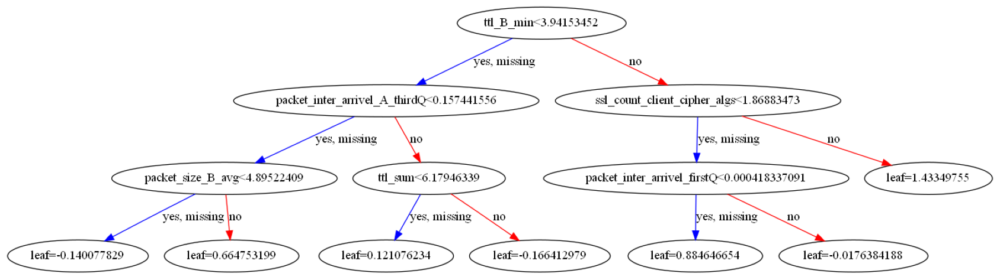

In [55]:
print("XGB Tree Splits (before RFE):")
print("-------------------------")

rcParams["figure.figsize"] = 30, 15
plot_tree(gscv_xgb.best_estimator_);

And our feature importances; this should give us an inkling as to what we should expect from XGB + RFE

XGB Feature Importances (before RFE):
-------------------------


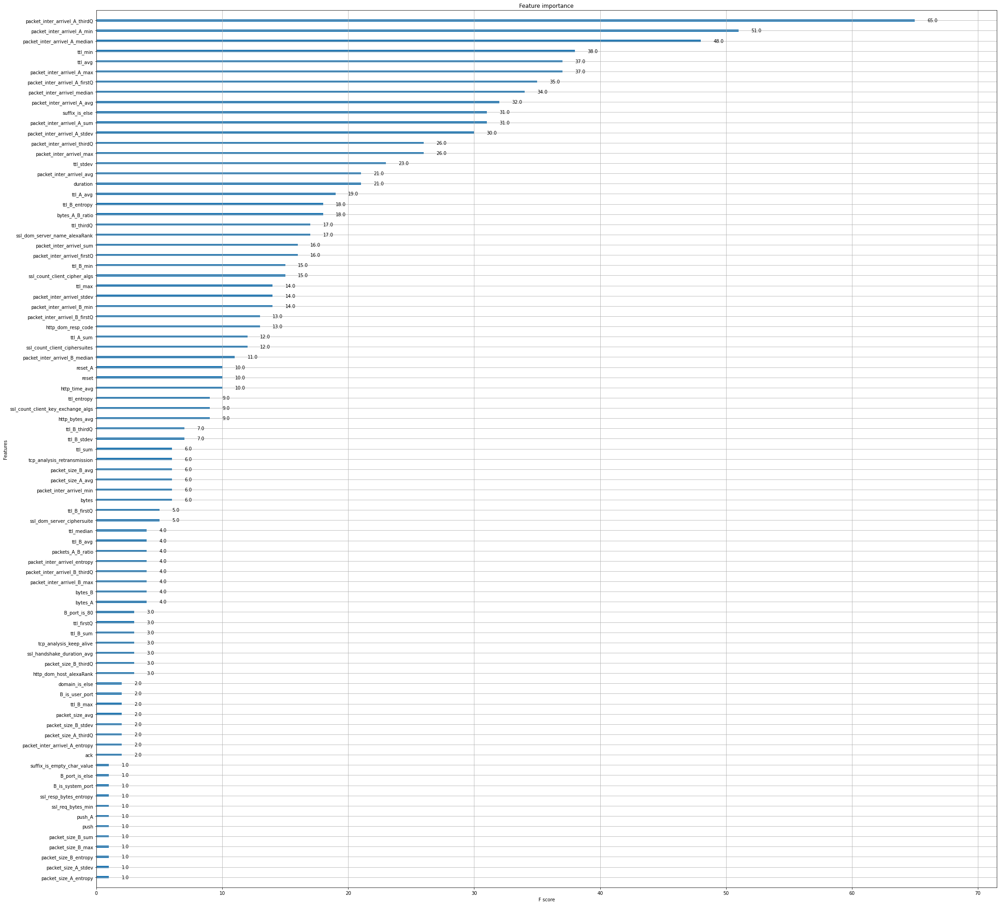

In [56]:
print("XGB Feature Importances (before RFE):")
print("-------------------------")

rcParams['figure.figsize'] = 35, 35
plot_importance(gscv_xgb.best_estimator_);

Intriguing stuff: according to our tree-based classifier, packet 'A' inter-arrival times and related statistical measures dominate in feature importances followed by TTLs. TTL (Time To Live) refers to the amount of time that a packet of data is destined to exist for inside of a network before being discarded by a router. This is done because when a packet is created and transmitted, it could possible continue to pass from router to router indefinitely. TTL prevents this. Basically, our tree has determined that the amount of time packets take to arrive along with how long they exist for can determine whether a device is of a certain type.

From the data we have, this seems to fit in with our intuition: a smoke detector will acknowledge, transmit and receive information over the network much quicker than a smart TV would because its data wouldn't contain much. A smoke detector would probably transmit its uptime, liveliness, detection status and time since last ping whereas the smart TV would probably broadcast its uptime, storage space, location, requested application, TV remote location, volume, etc. Let's see if this approach is viable and validate our model.

#### XGB Validation

In [57]:
xgb_final_preds = gscv_xgb.best_estimator_.predict(ftest_X[X_test.columns])
print("### XGB VALIDATION ###")
print("-------------------------")
print("Final result: ", balanced_accuracy_score(ftest_y_le, xgb_final_preds),
      "\t({:.2f}%)".format(balanced_accuracy_score(ftest_y_le, xgb_final_preds) * 100))

### XGB VALIDATION ###
-------------------------
Final result:  0.9566666666666668 	(95.67%)


## Model building round 1: Summary
Reassuring results: all of our classifiers worked rather well with log transformed data. Some interesting takeaways:
1. QDA performed better than LDA did, which adds credibility to the assumption that our data is not linearly separable. Whether this is truly the case or is an artifact of dimensionality is debatable, but nevertheless both classifers performed quite satisfactorily.
2. The SVM responded well to normalised data, but did so with a C value of 10 and, rather surprisingly, with a linear kernel. The highest C value out of the bunch isn't too unexpected because the higher C is, the more the SVM attempts to perfect its classification; but the linear kernel lends credibility to the argument that our data probably is linearly separable in some higher dimension and isn't linearly separable in a lower dimension. This also might back up our QDA classifier's performance: the data is not linearly separable in a 2D plane.
3. XGB quite unsurprisingly performed the best, not only on training data but also in its generalisation to unseen data.

We probably could just end this entire exercise here and call it a month, at which point I would personally decide to proceed further into testing & production with our QDA model or an ensemble of our QDA and LDA models, but let's indulge our curiosity and see how our performance changes with some linear and non-linear dimensionality reduction and clustering (not sequentially: NLDR performs clustering as part of its various methods.) We'll begin with quickly running through RFE (manually) before moving onto NLDR methods.

# RFE
## RFE 1: LDA

CPU times: total: 6.28 s
Wall time: 5.46 s
Optimal number of features (LDA): 194
------------------------------


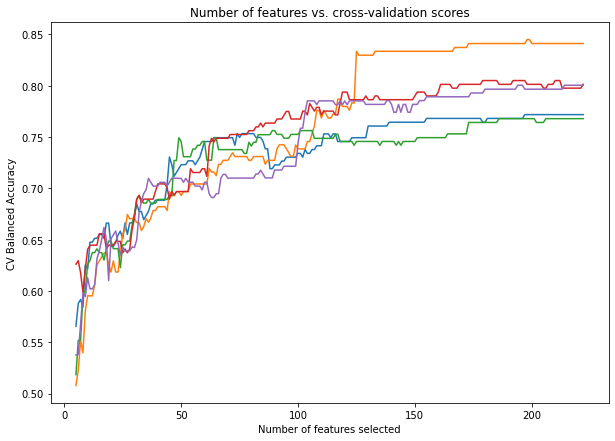

In [58]:
rfecv = RFECV(estimator = gscv_lda.best_estimator_,
              min_features_to_select = 5,
              scoring = "balanced_accuracy",
              n_jobs = -3)
%time rfecv = rfecv.fit(X_train, y_train_le)

print("Optimal number of features (LDA): {}".format(rfecv.n_features_))
print("------------------------------")

plt.figure(figsize = (10, 7))
plt.title("Number of features vs. cross-validation scores")
plt.xlabel("Number of features selected")
plt.ylabel("CV Balanced Accuracy")
plt.plot(range(5, len(rfecv.grid_scores_) + 5),
         rfecv.grid_scores_)
plt.show()

In [59]:
# where "felda" = feature_eliminated_lda
felda_cols = X_train.columns[rfecv.support_]

%time gscv_lda.fit(X = X_train[felda_cols], y = y_train_le)
pred_train_felda = gscv_lda.best_estimator_.predict(X_train[felda_cols])
pred_test_felda = gscv_lda.best_estimator_.predict(X_test[felda_cols])
lda_final_preds = gscv_lda.best_estimator_.predict(ftest_X[felda_cols])

print("\n### GRID SEARCH: FEATURE ELIMINATED LDA ###")
print("-------------------------")
print("Best estimator:\t\t", gscv_lda.best_estimator_, "\nBest score:\t\t", gscv_lda.best_score_,
      "\t({:.2f}%)".format(gscv_lda.best_score_ * 100))
print("Balanced accuracy train:", balanced_accuracy_score(y_train_le, pred_train_felda),
      "\t({:.2f}%)".format(balanced_accuracy_score(y_train_le, pred_train_felda) * 100))
print("Balanced accuracy test:\t", balanced_accuracy_score(y_test_le, pred_test_felda),
      "\t({:.2f}%)".format(balanced_accuracy_score(y_test_le, pred_test_felda) * 100))
print("Validation final result:", balanced_accuracy_score(ftest_y_le, lda_final_preds),
      "\t({:.2f}%)".format(balanced_accuracy_score(ftest_y_le, lda_final_preds) * 100))

CPU times: total: 547 ms
Wall time: 238 ms

### GRID SEARCH: FEATURE ELIMINATED LDA ###
-------------------------
Best estimator:		 LinearDiscriminantAnalysis(shrinkage='auto', solver='lsqr') 
Best score:		 0.7942368742368742 	(79.42%)
Balanced accuracy train: 0.8164179104477611 	(81.64%)
Balanced accuracy test:	 0.7984848484848485 	(79.85%)
Validation final result: 0.8688888888888889 	(86.89%)


RFE won't work with QDA because there's no real dimensionality reduction happening there: QDA doesn't actually have either a `coef_` or `feature_importances_` attribute. We can move onto SVC because our best recommended kernel was "linear", and by this point we should be expecting linear models/methods to come with a coefficient and an intercept (or multiple coefficients and intercepts).

## RFE 2: SVC
Don't forget to fit `rfecv` on ***normalised*** data!

CPU times: total: 4.41 s
Wall time: 9.26 s
Optimal number of features (SVC): 69
------------------------------


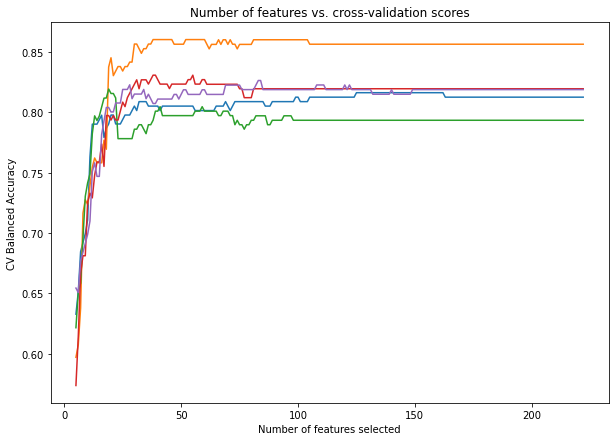

In [60]:
rfecv = RFECV(estimator = gscv_svc.best_estimator_,
              min_features_to_select = 5,
              scoring = "balanced_accuracy",
              n_jobs = -3)
%time rfecv = rfecv.fit(X_train_mmx, y_train_le)

print("Optimal number of features (SVC): {}".format(rfecv.n_features_))
print("------------------------------")

plt.figure(figsize = (10, 7))
plt.title("Number of features vs. cross-validation scores")
plt.xlabel("Number of features selected")
plt.ylabel("CV Balanced Accuracy")
plt.plot(range(5, len(rfecv.grid_scores_) + 5),
         rfecv.grid_scores_)
plt.show()

In [61]:
# where "fesvc" = feature_eliminated_svc
fesvc_cols = X_train.columns[rfecv.support_]

mmx_scale_fesvc = MinMaxScaler(feature_range = (-1, 1))
X_train_femmx = mmx_scale_fesvc.fit_transform(X_train[fesvc_cols])
X_test_femmx = mmx_scale_fesvc.transform(X_test[fesvc_cols])

%time gscv_svc.fit(X = X_train_femmx, y = y_train_le)
pred_train_fesvc = gscv_svc.best_estimator_.predict(X_train_femmx)
pred_test_fesvc = gscv_svc.best_estimator_.predict(X_test_femmx)
svc_final_preds = gscv_svc.best_estimator_.predict(mmx_scale_fesvc.transform(ftest_X[fesvc_cols]))

print("\n### GRID SEARCH: FEATURE ELIMINATED SVC ###")
print("-------------------------")
print("Best estimator:\t\t", gscv_svc.best_estimator_, "\nBest score:\t\t", gscv_svc.best_score_,
      "\t({:.2f}%)".format(gscv_svc.best_score_ * 100))
print("Balanced accuracy train:", balanced_accuracy_score(y_train_le, pred_train_fesvc),
      "\t({:.2f}%)".format(balanced_accuracy_score(y_train_le, pred_train_fesvc) * 100))
print("Balanced accuracy test:\t", balanced_accuracy_score(y_test_le, pred_test_fesvc),
      "\t({:.2f}%)".format(balanced_accuracy_score(y_test_le, pred_test_fesvc) * 100))
print("Validation final result:", balanced_accuracy_score(ftest_y_le, svc_final_preds),
      "\t({:.2f}%)".format(balanced_accuracy_score(ftest_y_le, svc_final_preds) * 100))

Fitting 5 folds for each of 672 candidates, totalling 3360 fits
CPU times: total: 2.73 s
Wall time: 24.3 s

### GRID SEARCH: FEATURE ELIMINATED SVC ###
-------------------------
Best estimator:		 SVC(C=10, degree=1, kernel='linear', random_state=1337) 
Best score:		 0.8240374440374441 	(82.40%)
Balanced accuracy train: 0.8559701492537313 	(85.60%)
Balanced accuracy test:	 0.8424242424242424 	(84.24%)
Validation final result: 0.8599999999999999 	(86.00%)


This is interesting: with only 31% of the features, the SVC performs exactly the same (within ±1%) as with 100% of the features and finishes quicker! This could allow us to use our SVC as a part of the ensemble mentioned earlier for production purposes, in conjunction with either only the QDA classifier or both QDA and LDA classifiers. Fascinating!

## RFE 3: XGB

In [ ]:
rfecv = RFECV(estimator = gscv_xgb.best_estimator_,
              min_features_to_select = 5,
              scoring = "balanced_accuracy",
              n_jobs = -3)
%time rfecv = rfecv.fit(X_train, y_train_le)

print("Optimal number of features (XGB): {}".format(rfecv.n_features_))
print("------------------------------")

plt.figure(figsize = (10, 7))
plt.title("Number of features vs. cross-validation scores")
plt.xlabel("Number of features selected")
plt.ylabel("CV Balanced Accuracy")
plt.plot(range(5, len(rfecv.grid_scores_) + 5),
         rfecv.grid_scores_)
plt.show()

In [ ]:
# where "fexgb" = feature_eliminated_xgb
fexgb_cols = X_train.columns[rfecv.support_]

%time gscv_xgb.fit(X = X_train[fexgb_cols], y = y_train_le)
pred_train_fexgb = gscv_xgb.best_estimator_.predict(X_train[fexgb_cols])
pred_test_fexgb = gscv_xgb.best_estimator_.predict(X_test[fexgb_cols])
xgb_final_preds = gscv_xgb.best_estimator_.predict(ftest_X[fexgb_cols])

print("\n### GRID SEARCH: FEATURE ELIMINATED XGB ###")
print("-------------------------")
print("Best estimator:\t\t", gscv_xgb.best_estimator_, "\nBest score:\t\t", gscv_xgb.best_score_,
      "\t({:.2f}%)".format(gscv_xgb.best_score_ * 100))
print("Balanced accuracy train:", balanced_accuracy_score(y_train_le, pred_train_fexgb),
      "\t({:.2f}%)".format(balanced_accuracy_score(y_train_le, pred_train_fexgb) * 100))
print("Balanced accuracy test:\t", balanced_accuracy_score(y_test_le, pred_test_fexgb),
      "\t({:.2f}%)".format(balanced_accuracy_score(y_test_le, pred_test_fexgb) * 100))
print("Validation final result:", balanced_accuracy_score(ftest_y_le, xgb_final_preds),
      "\t({:.2f}%)".format(balanced_accuracy_score(ftest_y_le, xgb_final_preds) * 100))

As our common sense told and tells us, feature selection results in loss of generality (so does outlier removal, unless both techniques are inherent requirements of the analysis being carried out.) This can be very clearly seen in the slightly worse performance of the models after performing RFE. However, the drop in performance is negligible and if it's accompanied with a strong reduction in dimensionality (as in the case of our SVC), it might be well worth it depending on the model's use case (for example, an edge learner device would require a model that uses the smallest amount of space.) In this case however (and generally) I personally prefer to keep as much data intact as possible, and so would choose to regularise rather than reduce.

Additionally, for this dataset we do not want to remove outliers or features because such techniques are not inherent to this analysis: we cannot ignore a device on a network simply because one aspect of the network's reponse took "longer than usual" for that device. In other words, just because a smoke detector took longer than the average ACK time to acknowledge its connectivity doesn't mean we can ignore it because doing so would provide a significant attack surface up on a silver platter.

**[Future me]:** At this point I was going to include a section on correlation clustering. The original thought was that because our data has extreme correlations and collinearity, an alternative to the traditional methods of dimensionality reduction and regularisation would be to cluster our data using Pearson correlation as a distance metric, which would result in a reduced feature set - for example, if features `ack` and `bytes` have a correlation of `0.82`, they would be clubbed together into, say, feature `ack_bytes` which addresses correlation _and_ also contributes to dimensionality reduction. The new resulting features could then be used against the original target classes for classification. However upon further thought it seems like this approach won't really work because classification after clustering is done to identify which cluster new data would fall into, not so much identifying which original target classes a cluster falls into. Additionally, clustering results in labels which are simply names used to identify a certain group of features. These labels are not features in and of themselves because no data transformation has happened in order to bring these labels to life, so to speak. Regardless, I have left the vestigial code in for future reference.

The PCA section follows this, followed by NLDR.

In [ ]:
# print("Clustermap by Correlation")
# print("------------------------------")
# sns.clustermap(data = df_3d.transpose(),
#                cmap = "RdBu_r",
#                square = True,
#                metric = "correlation",
#                method = "single",
#                row_cluster = True,
#                col_cluster = False,
#                figsize = (50, 50),
#                cbar_pos = (0.05, 0.95, 0.90, 0.015),
#                cbar_kws = {"orientation": "horizontal"},
#                dendrogram_ratio = (0.382, 0.085));

In [ ]:
# from scipy.cluster.hierarchy import linkage, dendrogram, fcluster
# from scipy.spatial.distance import pdist, squareform

# dissimilarity = 1 - abs(df_3d.corr())
# hierarchy = linkage(squareform(dissimilarity), method = "single")

# plt.figure(figsize = (30, 35))
# dendrogram(hierarchy, labels = df_3d.columns, orientation = "left");

This would be a good time to verify whether our clustermap clustered our features the same way as our linkage did. Turns out, it did. Interestingly enough, if the clustermap is given `df_3d.corr()` as the input data, the clusters won't match up. Now we can proceed to finish the clustering, plot out the new correlation heatmap and rerun our models using the clustered data.

In [ ]:
# labels = fcluster(hierarchy, 0.80, criterion = "distance")
# labels

In [ ]:
# Another MCVE of what we're about to use np.argsort() for

# x = numpy.array([1.48, 1.41, 0.0, 0.1])
# print x.argsort()

# should expect the result to be [2 3 1 0], which means:
# 1. the smallest array element (0.0) is at index 2
# 2. the next smallest element (0.01) is at index 3
# 3. the next smallest element (1.41) is at index 1
# 4. the next smallest element (1.48) is at index 0

In [ ]:
# Keep the indices to sort labels
# labels_order = np.argsort(labels)

# Build a new dataframe with the sorted columns
# for idx, i in enumerate(df_3d.columns[labels_order]):
#     if idx == 0:
#         clustered = pd.DataFrame(df_3d[i])
#     else:
#         df_to_append = pd.DataFrame(df_3d[i])
#         clustered = pd.concat([clustered, df_to_append], axis=1)

# Plot the new dataframe
# fig, ax = plt.subplots(figsize=(50, 50))
# sns.heatmap(data = clustered.corr(),
#             cmap = "RdBu_r",
#             square = True,
#             cbar_kws = {"shrink": 0.5},
#             ax = ax);

Now that we've made it this far and we have clusters on the basis of correlation as the distance metric, how do we use these clusters to perform our classification against the original target classes? These clusters don't have data of their own, they only contain the names of the features that belong to them - the cluster labels are not features in and of themselves! While we mull this over, let's get ahead on using PCA before moving onto NLDR. This time however we're going to fully use the power of pipelines so that we have less work to do in favour of our grid search having more work to do.

# Principal Component Analysis
No real explanation required here, this is just going to be a simple and straightforward PCA.

# Non-linear Dimensionality Reduction
When it comes to manifold learning, the foundational assumption is that all data is drawn from a low-dimensional manifold that's simply embedded within a higher dimensional vector space. To phrase it differently, all data is low-dimensional with high-dimensional noise. We'll go through 3 techniques here: LLE (LTSA), Spectral Clustering (potentially using a correlation matrix as our affinity matrix), and Isomap.

A small note here: we'll be using the recommended number of features given to us by RFE to determine the `n_components` we need from each NLDR technique.

## Locally Linear Embedding
Essentially, LLE uses KNN to cluster data points (like isomap) but then computes a set of weights for each point that can be used to represent that point as a linear combination of its neighbours. It then performs multiple PCAs to find the best low-dimensional embedding of the weighted points in such a way that each point can still be described using its linear combination of neighbours.

## Spectral Embedding

## Isomap Embedding
The biggest attribute of Isomap is that it seeks to preserve the geodesic distance of all data points relative to each other, addressing both local and global distances and topology. This way, Isomap can be thought of as an extension to metric MDS in the sense that geodesic distance is preserved using a weighted graph compared to metric MDS which embeds based on pairwise Euclidean distance.

Like LLE, Isomap also uses KNN in its initial step but differs from subsequent steps: after determining the neighbourhood, a neighbourhood graph is constructed with the edge lengths being equivalent to the Euclidean distance between two data points. The shortest path is then calculated on the basis of Isomap's definition of geodesic distance: the sum of edge weights along the shortest path between two nodes of the graph. After this is complete, lower-dimensional embedding is performed using classical MDS (interestingly enough, classical MDS on Euclidean distances is equivalent to PCA: Classic metric MDS is actually done by transforming distances into similarities and performing PCA on those. Therefore, PCA might be called the algorithm of the simplest MDS.)

Note that these methods of manifold learning are not the only ones available. Manifold learning is perhaps the most intriguing, fascinating and useful tool in the ML toolkit and therefore can be performed with multiple approaches: there are techniques like multidimensional scaling (MDS), Kernel PCAs, self-organising maps (SOMs), and most recently and interestingly, Uniform Manifold Approximation and Projection (UMAP) that all serve to sweeten the frosting on the proverbial mathematical crepe!